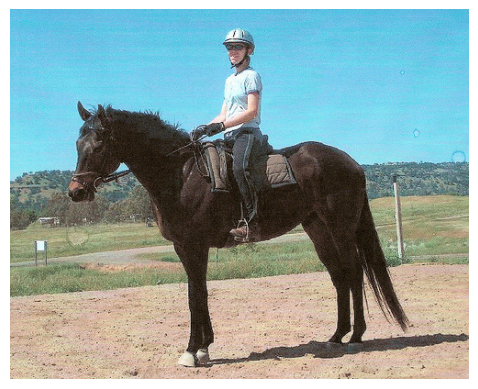

In [7]:
from PIL import Image
import matplotlib.pyplot as plt

# Load the image
image_path = 'D:/Journal/4/code/horse.jpg'
image = Image.open(image_path)

# Show the image
plt.imshow(image)
plt.axis('off')  # Hide the axis
plt.show()


In [8]:
# import numpy as np
# import cv2
# from PIL import Image
# import matplotlib.pyplot as plt

# # Load the image
# image_path = 'D:/Journal/4/code/horse.jpg'
# image = cv2.imread(image_path)  # Load the image with OpenCV
# image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert to RGB (for PIL/Matplotlib compatibility)

# # Add Gaussian noise
# mean = 0
# stddev = 25  # Standard deviation of the noise
# gaussian_noise = np.random.normal(mean, stddev, image.shape).astype(np.uint8)

# # Add the noise to the image
# noisy_image = cv2.add(image, gaussian_noise)

# # Show the noisy image
# plt.imshow(noisy_image)
# plt.axis('off')  # Hide the axis
# plt.show()


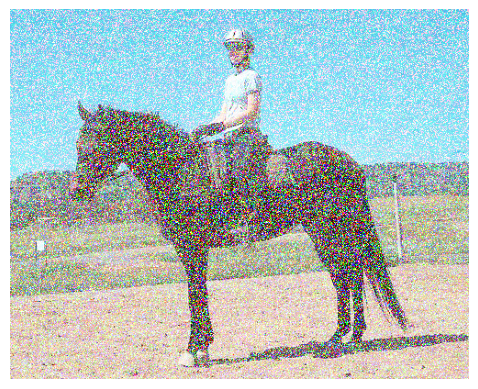

Image saved at: D:/Journal/4/code/horse_noisy.jpg


In [9]:
import numpy as np
import cv2
from PIL import Image
import matplotlib.pyplot as plt

# Load the image
image_path = 'D:/Journal/4/code/horse.jpg'
image = cv2.imread(image_path)  # Load the image with OpenCV
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert to RGB (for PIL/Matplotlib compatibility)

# Add Gaussian noise
mean = 0
stddev = 2  # Standard deviation of the noise
gaussian_noise = np.random.normal(mean, stddev, image.shape).astype(np.uint8)

# Add the noise to the image
noisy_image = cv2.add(image, gaussian_noise)

# Save the noisy image
output_path = 'D:/Journal/4/code/horse_noisy.jpg'
noisy_image_bgr = cv2.cvtColor(noisy_image, cv2.COLOR_RGB2BGR)  # Convert back to BGR for OpenCV
cv2.imwrite(output_path, noisy_image_bgr)

# Show the noisy image
plt.imshow(noisy_image)
plt.axis('off')  # Hide the axis
plt.show()

print(f"Image saved at: {output_path}")


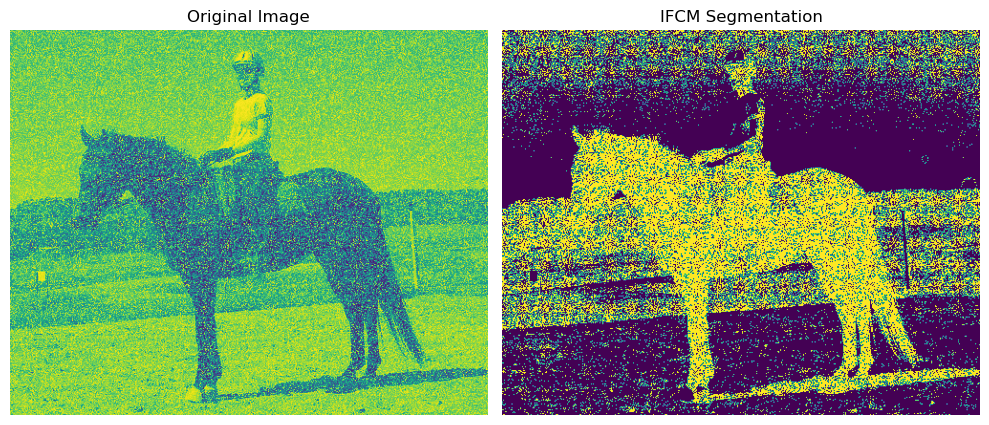

In [13]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

def ifcm_image_segmentation(data, num_clusters=2, m=2, h=0.1):
    num_samples, num_features = data.shape
    cluster_centers = np.random.rand(num_clusters, num_features)
    u = np.random.rand(num_samples, num_clusters)
    v = np.random.rand(num_samples, num_clusters)
    hesitancy = np.full((num_samples, num_clusters), h)

    max_iters = 1
    error_threshold = 1e-4

    for iteration in range(max_iters):
        for j in range(num_clusters):
            numerator = np.sum((u[:, j] ** m + (1 - v[:, j]) ** m)[:, np.newaxis] * data, axis=0)
            denominator = np.sum((u[:, j] ** m + (1 - v[:, j]) ** m))
            cluster_centers[j] = numerator / denominator

        for i in range(num_samples):
            for j in range(num_clusters):
                dist_ij = np.linalg.norm(data[i] - cluster_centers[j])
                u[i, j] = 1 / (1 + (dist_ij ** 2 / (hesitancy[i, j] ** 2)))

            for k in range(num_clusters):
                if k == np.argmax(u[i]):
                    v[i, k] = 1
                else:
                    v[i, k] = 0

        if np.linalg.norm(u - v) < error_threshold:
            break

    cluster_assignments = np.argmax(u, axis=1)
    return cluster_assignments, u, v

# Load the original image
image_path = "D:/Journal/4/code/horse_noisy.jpg"
image = Image.open(image_path).convert('L')  # Convert to grayscale

# Convert the image to a NumPy array
image_array = np.array(image)

# Normalize the image array
image_norm = image_array / 255.0

# Reshape the image array for clustering
data = image_norm.flatten().reshape(-1, 1)

# Apply Intuitionistic Fuzzy C-Means clustering
result_image, membership_matrix, non_membership_matrix = ifcm_image_segmentation(data, num_clusters=4, m=2, h=0.1)

# Reshape the clustered result back to the image shape
result = result_image.reshape(image_array.shape)

# Plot the original image and the clustered result
plt.figure(figsize=(10, 5))

# Plot the original image
plt.subplot(1, 2, 1)
plt.imshow(image)
plt.title('Original Image')
plt.axis('off')

# Plot the IFCM segmented image
plt.subplot(1, 2, 2)
plt.imshow(result)
plt.title('IFCM Segmentation')
plt.axis('off')

plt.tight_layout()
plt.show()


In [14]:
import numpy as np
from skimage.metrics import peak_signal_noise_ratio as compare_psnr

# Load the ground truth image
ground_truth_array = np.array(image)

# Convert clustered_image to uint8
clustered_image_uint8 = (result * 255).astype(np.uint8)

# Resize the clustered image to match the ground truth dimensions
clustered_image_resized = np.array(
    Image.fromarray(clustered_image_uint8).resize(
        ground_truth_array.shape[::-1], Image.NEAREST
    )
)

# Calculate PSNR
psnr_value = compare_psnr(ground_truth_array, clustered_image_resized)

# Calculate Mean Error (ME)
mean_error = np.mean(np.abs(ground_truth_array - clustered_image_resized))

# Output the results
print(f"PSNR Value: {psnr_value} dB")
print(f"Mean Error (ME): {mean_error}")


PSNR Value: 8.950008332744464 dB
Mean Error (ME): 182.5483970223325


C:\Users\Admin\AppData\Local\Temp\ipykernel_18092\411176636.py:26: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  u_sum = np.sum((np.linalg.norm(data[i] - centroids[j]) / np.linalg.norm(data[i] - centroids[k])) ** (1 / (m - 1)) for k in range(n_clusters))
C:\Users\Admin\AppData\Local\Temp\ipykernel_18092\411176636.py:42: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  eta_sum = np.sum(xi[i, k] for k in range(n_clusters))
C:\Users\Admin\AppData\Local\Temp\ipykernel_18092\411176636.py:43: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  eta[i, j] = 1 - xi[i, j] - ((n_clusters - 1) / n_clusters) *

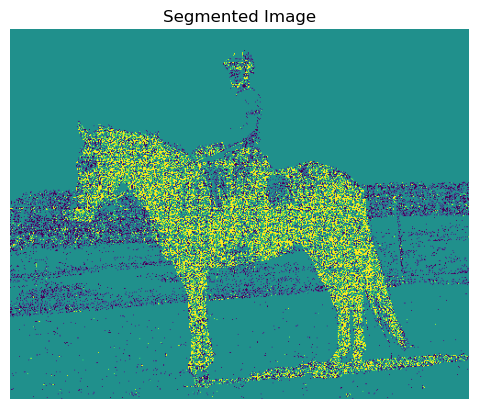

In [15]:
import numpy as np
import cv2

def pfcm(image, n_clusters, max_iter=1, m=2, alpha=1, error=1e-5):
    # Reshape the image to a vector
    data = image.reshape((-1, 1))

    # Normalize the data to the range [0, 1]
    data = data.astype(float) / 255.0

    # Number of pixels
    n_pixels = data.shape[0]

    # Initialize centroids randomly
    centroids = np.random.rand(n_clusters, data.shape[1])

    # Initialize membership, noise robustness, and spatial neighborhood matrices
    u = np.random.rand(n_pixels, n_clusters)
    eta = np.zeros((n_pixels, n_clusters))
    xi = np.zeros((n_pixels, n_clusters))

    for _ in range(max_iter):
        # Update membership
        for i in range(n_pixels):
            for j in range(n_clusters):
                u_sum = np.sum((np.linalg.norm(data[i] - centroids[j]) / np.linalg.norm(data[i] - centroids[k])) ** (1 / (m - 1)) for k in range(n_clusters))
                u[i, j] = (1 - eta[i, j] - xi[i, j]) / u_sum

        # Update centroids
        memberships = (u / (1 - eta - xi)) ** m
        centroids_new = np.dot(memberships.T, data) / np.sum(memberships, axis=0)[:, None]

        # Check for convergence
        if np.linalg.norm(centroids_new - centroids) < error:
            break

        centroids = centroids_new

        # Update noise robustness and spatial neighborhood matrices
        for i in range(n_pixels):
            for j in range(n_clusters):
                eta_sum = np.sum(xi[i, k] for k in range(n_clusters))
                eta[i, j] = 1 - xi[i, j] - ((n_clusters - 1) / n_clusters) * (eta_sum / np.sum((u[i, j] / u[i, k]) * ((np.linalg.norm(data[i] - centroids[j]) / np.linalg.norm(data[i] - centroids[k])) ** (1 / (m - 1))) for k in range(n_clusters)))
                xi[i, j] = 1 - (u[i, j] + eta[i, j]) - (1 - (u[i, j] + eta[i, j]) ** alpha) ** (1 / alpha)

    # Reshape the memberships to the original image shape
    memberships = u.reshape(image.shape[0], image.shape[1], n_clusters)

    # Select the cluster with the maximum membership for each pixel
    segmented_img = np.argmax(memberships, axis=2)

    return segmented_img

# Read the input image
image = cv2.imread("D:/Journal/4/code/horse_noisy.jpg", cv2.IMREAD_GRAYSCALE)

# Apply PFCM clustering
n_clusters = 3
clustered_image = pfcm(image, n_clusters)

# Display the segmented image
plt.imshow(clustered_image)
plt.title('Segmented Image')
# plt.colorbar()
plt.axis('off')
plt.show()


In [16]:
import numpy as np
from skimage.metrics import peak_signal_noise_ratio as compare_psnr

# Load the ground truth image
ground_truth_array = np.array(image)

# Convert clustered_image to uint8
clustered_image_uint8 = (clustered_image * 255).astype(np.uint8)

# Resize the clustered image to match the ground truth dimensions
clustered_image_resized = np.array(
    Image.fromarray(clustered_image_uint8).resize(
        ground_truth_array.shape[::-1], Image.NEAREST
    )
)

# Calculate PSNR
psnr_value = compare_psnr(ground_truth_array, clustered_image_resized)

# Calculate Mean Error (ME)
mean_error = np.mean(np.abs(ground_truth_array - clustered_image_resized))

# Output the results
print(f"PSNR Value: {psnr_value} dB")
print(f"Mean Error (ME): {mean_error}")


PSNR Value: 9.02331110918415 dB
Mean Error (ME): 175.8401836228288


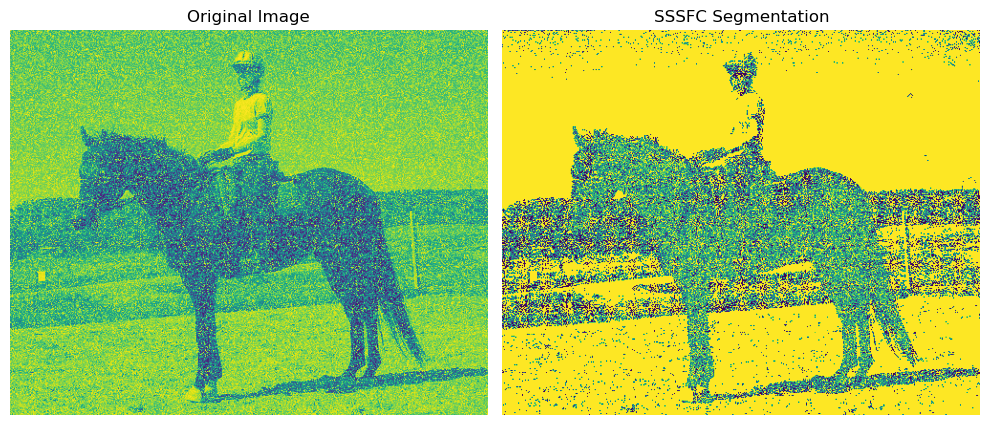

In [101]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

def sssfc(data, labeled_data, labels, num_clusters=4, m=2, threshold=1e-4, max_iters=1):
    num_samples, num_features = data.shape
    num_labeled = labeled_data.shape[0]

    # Initialize cluster centers randomly
    R = np.random.rand(num_clusters, 1)
    cluster_centers = np.min(data) + R * (np.max(data) - np.min(data))
    
    # Initialize membership degrees randomly
    u = np.random.rand(num_samples, num_clusters)
    u /= np.sum(u, axis=1, keepdims=True)
    
    # Initialize auxiliary membership degrees based on labeled data
    u_bar = np.zeros((num_samples, num_clusters))
    for i in range(num_labeled):
        u_bar[i, labels[i]] = 1
        
    for iteration in range(max_iters):
        # Update membership degrees
        for i in range(num_samples):
            for k in range(num_clusters):
                if m > 1:
                    dist_ik = np.linalg.norm(data[i] - cluster_centers[k])
                    u[i, k] = u_bar[i, k] + (1 - np.sum(u_bar[i])) * (1 / (dist_ik ** 2 + 1e-10)) ** (1 / (m - 1)) / np.sum([(1 / (np.linalg.norm(data[i] - cluster_centers[j]) ** 2 + 1e-10)) ** (1 / (m - 1)) for j in range(num_clusters)])
                else:
                    if k == np.argmin([np.linalg.norm(data[i] - cluster_centers[j]) for j in range(num_clusters)]):
                        u[i, k] = u_bar[i, k] + (1 - np.sum(u_bar[i]))
                    else:
                        u[i, k] = u_bar[i, k]
        
        # Update cluster centers
        new_cluster_centers = np.zeros_like(cluster_centers)
        for k in range(num_clusters):
            numerator = np.sum([((u[i, k] - u_bar[i, k]) ** m) * data[i] for i in range(num_samples)], axis=0)
            denominator = np.sum([((u[i, k] - u_bar[i, k]) ** m) for i in range(num_samples)], axis=0)
            new_cluster_centers[k] = numerator / denominator

        # Check for convergence
        if np.linalg.norm(cluster_centers - new_cluster_centers) < threshold:
            break

        cluster_centers = new_cluster_centers
    
    cluster_assignments = np.argmax(u, axis=1)
    return cluster_assignments, u

# Load the original image
image_path = 'D:/Journal/4/code/horse_noisy.jpg'
image = Image.open(image_path).convert('L')  # Convert to grayscale

# Convert the image to a NumPy array
image_array = np.array(image)

# Normalize the image array
image_norm = image_array / 255.0

# Reshape the image array for clustering
data = image_norm.flatten().reshape(-1, 1)

# Define number of clusters
num_clusters = 4

# Labeled data (Example: we will use some random labeled data points for demonstration)
labeled_data = data[:100]
labels = np.random.randint(0, num_clusters, 100)

# Apply Semi-Supervised Standard Fuzzy Clustering
result_image, membership_matrix = sssfc(data, labeled_data, labels, num_clusters=num_clusters, m=2, threshold=1e-4, max_iters=1)

# Reshape the clustered result back to the image shape
result = result_image.reshape(image_array.shape)

# Plot the original image and the clustered result
plt.figure(figsize=(10, 5))

# Plot the original image
plt.subplot(1, 2, 1)
plt.imshow(image)
plt.title('Original Image')
plt.axis('off')

# Plot the SSSFC segmented image
plt.subplot(1, 2, 2)
plt.imshow(result)
plt.title('SSSFC Segmentation')
plt.axis('off')

plt.tight_layout()
plt.show()


In [104]:
import numpy as np
from skimage.metrics import peak_signal_noise_ratio as compare_psnr

# Load the ground truth image
ground_truth_array = np.array(image)

# Convert clustered_image to uint8
clustered_image_uint8 = (result * 255).astype(np.uint8)

# Resize the clustered image to match the ground truth dimensions
clustered_image_resized = np.array(
    Image.fromarray(clustered_image_uint8).resize(
        ground_truth_array.shape[::-1], Image.NEAREST
    )
)

# Calculate PSNR
psnr_value = compare_psnr(ground_truth_array, clustered_image_resized)

# Calculate Mean Error (ME)
mean_error = np.mean(np.abs(ground_truth_array - clustered_image_resized))

# Output the results
print(f"PSNR Value: {psnr_value} dB")
print(f"Mean Error (ME): {mean_error}")


PSNR Value: 8.520285714366992 dB
Mean Error (ME): 181.90587096774195


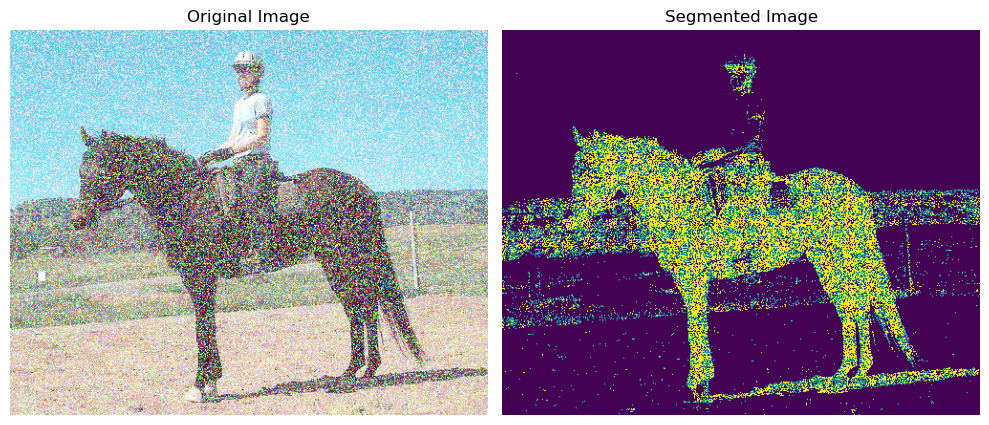

In [131]:
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt

# Kernel function (Gaussian)
def gaussian_kernel(x, c, sigma):
    return np.exp(-np.linalg.norm(x - c) ** 2 / (2 * sigma ** 2))

# Kernel matrix computation
def kernel_matrix(data, centers, sigma):
    N = data.shape[0]
    K = np.zeros((N, len(centers)))
    for i in range(N):
        for j in range(len(centers)):
            K[i, j] = gaussian_kernel(data[i], centers[j], sigma)
    return K

# Kernel-based Fuzzy C-Means clustering
def kfcm(data, num_clusters=4, m=2, sigma=1.0, epsilon=1e-4, max_iters=1):
    N, d = data.shape
    
    # Initialize cluster centers randomly
    np.random.seed(42)
    cluster_centers = data[np.random.choice(N, num_clusters, replace=False)]
    
    # Initialize membership matrix randomly
    U = np.random.rand(N, num_clusters)
    U = U / np.sum(U, axis=1, keepdims=True)  # Normalize each row to sum to 1
    
    # Main loop
    for iter_count in range(max_iters):
        # Calculate the kernel matrix
        K = kernel_matrix(data, cluster_centers, sigma)
        
        # Update cluster centers
        numerator = np.dot(np.transpose(K ** m), data)
        denominator = np.sum(U ** m, axis=0)[:, np.newaxis]
        cluster_centers = numerator / denominator
        
        # Update membership matrix
        dist = np.sum((data[:, None] - cluster_centers) ** 2, axis=2)
        u_exp = (1 - K) ** (2 / (m - 1))
        U_new = u_exp / np.sum(u_exp, axis=1)[:, np.newaxis]
        
        # Check convergence
        if np.linalg.norm(U - U_new) < epsilon:
            break
        
        U = U_new
    
    return U, cluster_centers

# Function to segment an image using KFCM
def segment_image(image_path, num_clusters=4, m=2, sigma=1.0, epsilon=1e-4, max_iters=1):
    # Load the image
    img = Image.open(image_path)
    img = img.convert("L")  # Convert to grayscale
    
    # Convert image to numpy array
    img_array = np.array(img)
    height, width = img_array.shape
    
    # Flatten the image into a matrix where each row represents a pixel
    data = img_array.reshape(-1, 1)  # Reshape to (num_pixels, 1)
    data = data.astype(float)  # Convert to float
    
    # Perform KFCM clustering
    U, cluster_centers = kfcm(data, num_clusters=num_clusters, m=m, sigma=sigma, epsilon=epsilon, max_iters=max_iters)
    
    # Assign cluster labels based on maximum membership
    labels = np.argmax(U, axis=1)
    
    # Reshape labels back into the original image shape
    segmented_image = labels.reshape(height, width)
    
    return segmented_image

# Example usage:
image_path = 'D:/Journal/4/code/horse_noisy.jpg'
segmented_image = segment_image(image_path, num_clusters=4, m=2, sigma=25.0)

# Display the original image and segmented image
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(Image.open(image_path))
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(segmented_image)  # Adjust the colormap as needed
plt.title('Segmented Image')
plt.axis('off')

plt.tight_layout()
plt.show()


In [132]:
import numpy as np
from skimage.metrics import peak_signal_noise_ratio as compare_psnr

# Load the ground truth image
ground_truth_array = np.array(image)

# Convert clustered_image to uint8
clustered_image_uint8 = (segmented_image * 255).astype(np.uint8)

# Resize the clustered image to match the ground truth dimensions
clustered_image_resized = np.array(
    Image.fromarray(clustered_image_uint8).resize(
        ground_truth_array.shape[::-1], Image.NEAREST
    )
)

# Calculate PSNR
psnr_value = compare_psnr(ground_truth_array, clustered_image_resized)

# Calculate Mean Error (ME)
mean_error = np.mean(np.abs(ground_truth_array - clustered_image_resized))

# Output the results
print(f"PSNR Value: {psnr_value} dB")
print(f"Mean Error (ME): {mean_error}")


PSNR Value: 8.912695891603772 dB
Mean Error (ME): 182.1627394540943


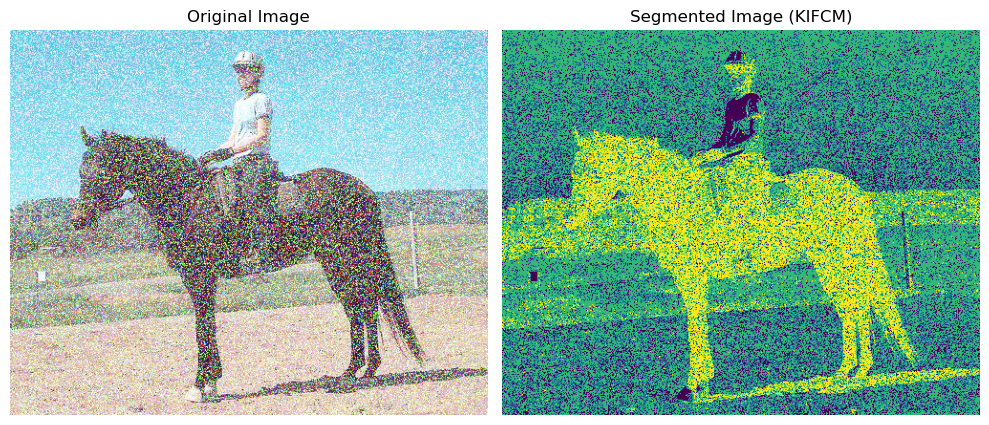

In [145]:
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt

# Gaussian kernel function
def gaussian_kernel(x, c, sigma):
    return np.exp(-np.linalg.norm(x - c) ** 2 / (2 * sigma ** 2))

# Kernel matrix computation
def kernel_matrix(data, centers, sigma):
    N = data.shape[0]
    K = np.zeros((N, len(centers)))
    for i in range(N):
        for j in range(len(centers)):
            K[i, j] = gaussian_kernel(data[i], centers[j], sigma)
    return K

# Kernel-based Intuitionistic Fuzzy C-Means clustering
def kifcm(data, num_clusters=4, m=2, alpha=0.5, sigma=1.0, epsilon=1e-4, max_iters=1):
    N, d = data.shape
    
    # Initialize cluster centers randomly
    np.random.seed(42)
    cluster_centers = data[np.random.choice(N, num_clusters, replace=False)]
    
    # Initialize membership and non-membership matrices randomly
    U = np.random.rand(N, num_clusters)
    V = np.random.rand(N, num_clusters)
    U = U / np.sum(U, axis=1, keepdims=True)  # Normalize each row to sum to 1
    V = V / np.sum(V, axis=1, keepdims=True)  # Normalize each row to sum to 1
    
    # Main loop
    for iter_count in range(max_iters):
        # Calculate kernel matrices
        K = kernel_matrix(data, cluster_centers, sigma)
        K_complementary = kernel_matrix(data, cluster_centers, sigma)
        
        # Update membership and non-membership matrices
        u_exp = (1 - K) ** (2 / (m - 1))
        v_exp = (1 - K_complementary) ** (2 / (m - 1))
        
        numerator_u = u_exp + alpha * v_exp
        numerator_v = v_exp + alpha * u_exp
        
        denominator_u = np.sum(numerator_u, axis=1)[:, np.newaxis]
        denominator_v = np.sum(numerator_v, axis=1)[:, np.newaxis]
        
        U_new = numerator_u / denominator_u
        V_new = numerator_v / denominator_v
        
        # Update cluster centers
        numerator = np.dot(np.transpose(U_new ** m), data)
        denominator = np.sum(U_new ** m, axis=0)[:, np.newaxis]
        cluster_centers = numerator / denominator
        
        # Check convergence
        if np.linalg.norm(U - U_new) < epsilon:
            break
        
        U = U_new
        V = V_new
    
    return U, V, cluster_centers

# Function to segment an image using KIFCM
def segment_image_kifcm(image_path, num_clusters=4, m=2, alpha=0.5, sigma=10.0, epsilon=1e-4, max_iters=1):
    # Load the image
    img = Image.open(image_path)
    img = img.convert("L")  # Convert to grayscale
    
    # Convert image to numpy array
    img_array = np.array(img)
    height, width = img_array.shape
    
    # Flatten the image into a matrix where each row represents a pixel
    data = img_array.reshape(-1, 1)  # Reshape to (num_pixels, 1)
    data = data.astype(float)  # Convert to float
    
    # Perform KIFCM clustering
    U, V, cluster_centers = kifcm(data, num_clusters=num_clusters, m=m, alpha=alpha, sigma=sigma, epsilon=epsilon, max_iters=max_iters)
    
    # Assign cluster labels based on maximum membership
    labels = np.argmax(U, axis=1)
    
    # Reshape labels back into the original image dimensions
    segmented_image = labels.reshape(height, width)
    
    return segmented_image

# Example usage:
image_path = 'D:/Journal/4/code/horse_noisy.jpg'
segmented_image = segment_image_kifcm(image_path, num_clusters=4, m=2, alpha=0.5, sigma=20.0)

# Display the original image and segmented image
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(Image.open(image_path))
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(segmented_image)  # Adjust the colormap as needed
plt.title('Segmented Image (KIFCM)')
plt.axis('off')

plt.tight_layout()
plt.show()


In [146]:
import numpy as np
from skimage.metrics import peak_signal_noise_ratio as compare_psnr

# Load the ground truth image
ground_truth_array = np.array(image)

# Convert clustered_image to uint8
clustered_image_uint8 = (segmented_image * 255).astype(np.uint8)

# Resize the clustered image to match the ground truth dimensions
clustered_image_resized = np.array(
    Image.fromarray(clustered_image_uint8).resize(
        ground_truth_array.shape[::-1], Image.NEAREST
    )
)

# Calculate PSNR
psnr_value = compare_psnr(ground_truth_array, clustered_image_resized)

# Calculate Mean Error (ME)
mean_error = np.mean(np.abs(ground_truth_array - clustered_image_resized))

# Output the results
print(f"PSNR Value: {psnr_value} dB")
print(f"Mean Error (ME): {mean_error}")


PSNR Value: 4.842031645166779 dB
Mean Error (ME): 181.97225806451613


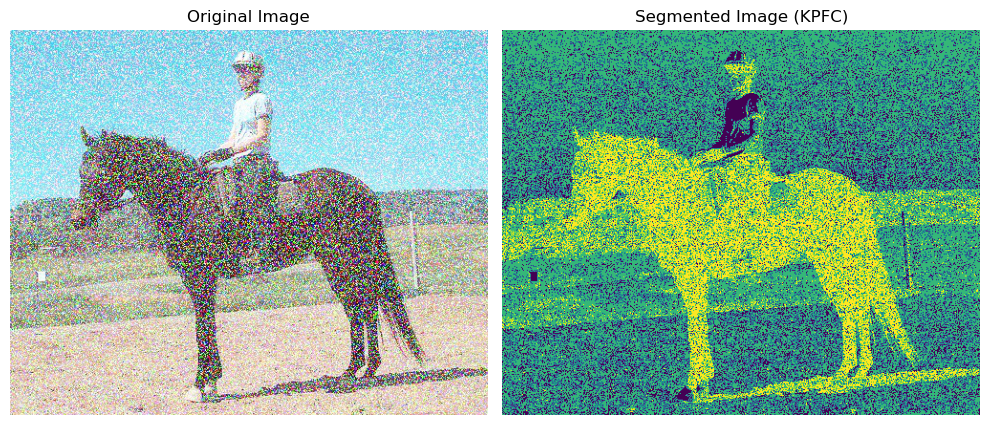

In [153]:
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt

# Gaussian kernel function
def gaussian_kernel(x, c, sigma):
    return np.exp(-np.linalg.norm(x - c) ** 2 / (2 * sigma ** 2))

# Kernel matrix computation
def kernel_matrix(data, centers, sigma):
    N = data.shape[0]
    K = np.zeros((N, len(centers)))
    for i in range(N):
        for j in range(len(centers)):
            K[i, j] = gaussian_kernel(data[i], centers[j], sigma)
    return K

# Kernel-based Picture Fuzzy C-Means clustering
def kpfc(data, num_clusters=4, m=2, alpha=0.5, sigma=1.0, epsilon=1e-4, max_iters=1):
    N, d = data.shape
    
    # Initialize cluster centers randomly
    np.random.seed(42)
    cluster_centers = data[np.random.choice(N, num_clusters, replace=False)]
    
    # Initialize membership, non-membership, and hesitation matrices randomly
    U = np.random.rand(N, num_clusters)
    V = np.random.rand(N, num_clusters)
    U = U / np.sum(U, axis=1, keepdims=True)  # Normalize each row to sum to 1
    V = V / np.sum(V, axis=1, keepdims=True)  # Normalize each row to sum to 1
    H = 1 - U - V  # Hesitation degree
    
    # Main loop
    for iter_count in range(max_iters):
        # Calculate kernel matrices
        K = kernel_matrix(data, cluster_centers, sigma)
        K_complementary = kernel_matrix(data, cluster_centers, sigma)
        
        # Update membership, non-membership, and hesitation matrices
        u_exp = (1 - K) ** (2 / (m - 1))
        v_exp = (1 - K_complementary) ** (2 / (m - 1))
        
        numerator_u = u_exp + alpha * v_exp
        numerator_v = v_exp + alpha * u_exp
        
        denominator_u = np.sum(numerator_u, axis=1)[:, np.newaxis]
        denominator_v = np.sum(numerator_v, axis=1)[:, np.newaxis]
        
        U_new = numerator_u / denominator_u
        V_new = numerator_v / denominator_v
        H_new = 1 - U_new - V_new  # Update hesitation degree
        
        # Update cluster centers
        numerator = np.dot(np.transpose(U_new ** m), data)
        denominator = np.sum(U_new ** m, axis=0)[:, np.newaxis]
        cluster_centers = numerator / denominator
        
        # Check convergence
        if np.linalg.norm(U - U_new) < epsilon:
            break
        
        U = U_new
        V = V_new
        H = H_new
    
    return U, V, H, cluster_centers

# Function to segment an image using KPFC
def segment_image_kpfc(image_path, num_clusters=4, m=2, alpha=0.5, sigma=1.0, epsilon=1e-4, max_iters=1):
    # Load the image
    img = Image.open(image_path)
    img = img.convert("L")  # Convert to grayscale
    
    # Convert image to numpy array
    img_array = np.array(img)
    height, width = img_array.shape
    
    # Flatten the image into a matrix where each row represents a pixel
    data = img_array.reshape(-1, 1)  # Reshape to (num_pixels, 1)
    data = data.astype(float)  # Convert to float
    
    # Perform KPFC clustering
    U, V, H, cluster_centers = kpfc(data, num_clusters=num_clusters, m=m, alpha=alpha, sigma=sigma, epsilon=epsilon, max_iters=max_iters)
    
    # Assign cluster labels based on maximum membership
    labels = np.argmax(U, axis=1)
    
    # Reshape labels back into the original image dimensions
    segmented_image = labels.reshape(height, width)
    
    return segmented_image

# Example usage:
image_path = 'D:/Journal/4/code/horse_noisy.jpg'
segmented_image = segment_image_kpfc(image_path, num_clusters=4, m=2, alpha=0.5, sigma=20.0)

# Display the original image and segmented image
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(Image.open(image_path))
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(segmented_image)  # Adjust the colormap as needed
plt.title('Segmented Image (KPFC)')
plt.axis('off')

plt.tight_layout()
plt.show()


In [148]:
import numpy as np
from skimage.metrics import peak_signal_noise_ratio as compare_psnr

# Load the ground truth image
ground_truth_array = np.array(image)

# Convert clustered_image to uint8
clustered_image_uint8 = (segmented_image * 255).astype(np.uint8)

# Resize the clustered image to match the ground truth dimensions
clustered_image_resized = np.array(
    Image.fromarray(clustered_image_uint8).resize(
        ground_truth_array.shape[::-1], Image.NEAREST
    )
)

# Calculate PSNR
psnr_value = compare_psnr(ground_truth_array, clustered_image_resized)

# Calculate Mean Error (ME)
mean_error = np.mean(np.abs(ground_truth_array - clustered_image_resized))

# Output the results
print(f"PSNR Value: {psnr_value} dB")
print(f"Mean Error (ME): {mean_error}")


PSNR Value: 2.1421043654418384 dB
Mean Error (ME): 180.68650620347395


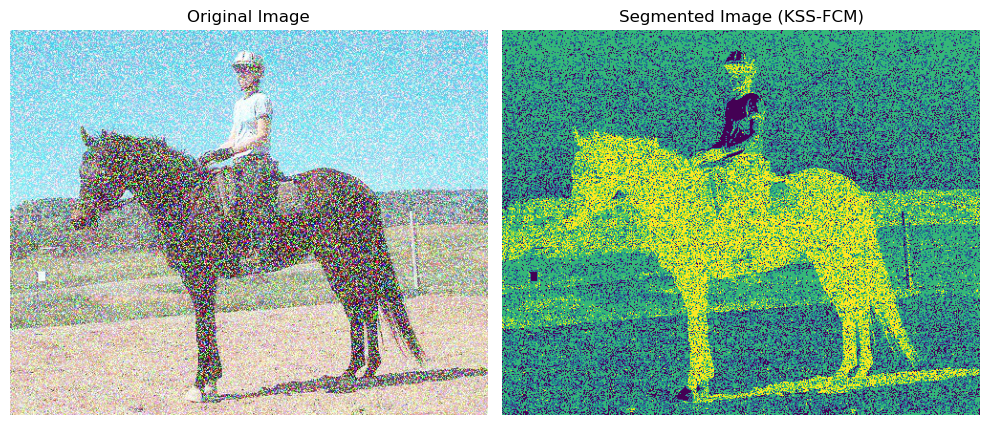

In [151]:
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt

# Gaussian kernel function
def gaussian_kernel(x, c, sigma):
    return np.exp(-np.linalg.norm(x - c) ** 2 / (2 * sigma ** 2))

# Kernel matrix computation
def kernel_matrix(data, centers, sigma):
    N = data.shape[0]
    K = np.zeros((N, len(centers)))
    for i in range(N):
        for j in range(len(centers)):
            K[i, j] = gaussian_kernel(data[i], centers[j], sigma)
    return K

# Kernel-based Semi-Supervised Fuzzy C-Means clustering
def kss_fcm(data, labeled_data, labeled_labels, num_clusters=4, m=2, alpha=0.5, beta=0.5, sigma=1.0, epsilon=1e-4, max_iters=1):
    N, d = data.shape
    labeled_indices = np.arange(len(labeled_data))
    
    # Initialize cluster centers randomly
    np.random.seed(42)
    cluster_centers = data[np.random.choice(N, num_clusters, replace=False)]
    
    # Initialize membership matrix randomly
    U = np.random.rand(N, num_clusters)
    U = U / np.sum(U, axis=1, keepdims=True)  # Normalize each row to sum to 1
    
    # Incorporate labeled data
    for idx, label in zip(labeled_indices, labeled_labels):
        U[idx, :] = 0
        U[idx, label] = 1
    
    # Main loop
    for iter_count in range(max_iters):
        # Calculate kernel matrix
        K = kernel_matrix(data, cluster_centers, sigma)
        
        # Update membership matrix
        u_exp = (1 - K) ** (2 / (m - 1))
        
        numerator_u = u_exp
        denominator_u = np.sum(numerator_u, axis=1)[:, np.newaxis]
        
        U_new = numerator_u / denominator_u
        
        # Reincorporate labeled data constraints
        for idx, label in zip(labeled_indices, labeled_labels):
            U_new[idx, :] = 0
            U_new[idx, label] = 1
        
        # Update cluster centers
        numerator = np.dot(np.transpose(U_new ** m), data)
        denominator = np.sum(U_new ** m, axis=0)[:, np.newaxis]
        cluster_centers = numerator / denominator
        
        # Check convergence
        if np.linalg.norm(U - U_new) < epsilon:
            break
        
        U = U_new
    
    return U, cluster_centers

# Function to segment an image using KSS-FCM
def segment_image_kss_fcm(image_path, labeled_data, labeled_labels, num_clusters=4, m=2, alpha=0.5, beta=0.5, sigma=1.0, epsilon=1e-4, max_iters=1):
    # Load the image
    img = Image.open(image_path)
    img = img.convert("L")  # Convert to grayscale
    
    # Convert image to numpy array
    img_array = np.array(img)
    height, width = img_array.shape
    
    # Flatten the image into a matrix where each row represents a pixel
    data = img_array.reshape(-1, 1)  # Reshape to (num_pixels, 1)
    data = data.astype(float)  # Convert to float
    
    # Perform KSS-FCM clustering
    U, cluster_centers = kss_fcm(data, labeled_data, labeled_labels, num_clusters=num_clusters, m=m, alpha=alpha, beta=beta, sigma=sigma, epsilon=epsilon, max_iters=max_iters)
    
    # Assign cluster labels based on maximum membership
    labels = np.argmax(U, axis=1)
    
    # Reshape labels back into the original image dimensions
    segmented_image = labels.reshape(height, width)
    
    return segmented_image

# Example usage:
image_path = 'D:/Journal/4/code/horse_noisy.jpg'

# Example of labeled data (for demonstration, you should provide real labeled data)
labeled_data = np.array([[100], [150], [200]])  # Example pixel values
labeled_labels = np.array([0, 1, 2])  # Corresponding labels

segmented_image = segment_image_kss_fcm(image_path, labeled_data, labeled_labels, num_clusters=4, m=2, alpha=0.5, beta=0.5, sigma=20.0)

# Display the original image and segmented image
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(Image.open(image_path))
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(segmented_image)  # Adjust the colormap as needed
plt.title('Segmented Image (KSS-FCM)')
plt.axis('off')

plt.tight_layout()
plt.show()


In [152]:
import numpy as np
from skimage.metrics import peak_signal_noise_ratio as compare_psnr

# Load the ground truth image
ground_truth_array = np.array(image)

# Convert clustered_image to uint8
clustered_image_uint8 = (segmented_image * 255).astype(np.uint8)

# Resize the clustered image to match the ground truth dimensions
clustered_image_resized = np.array(
    Image.fromarray(clustered_image_uint8).resize(
        ground_truth_array.shape[::-1], Image.NEAREST
    )
)

# Calculate PSNR
psnr_value = compare_psnr(ground_truth_array, clustered_image_resized)

# Calculate Mean Error (ME)
mean_error = np.mean(np.abs(ground_truth_array - clustered_image_resized))

# Output the results
print(f"PSNR Value: {psnr_value} dB")
print(f"Mean Error (ME): {mean_error}")


PSNR Value: 4.842031561276786 dB
Mean Error (ME): 181.97225310173698


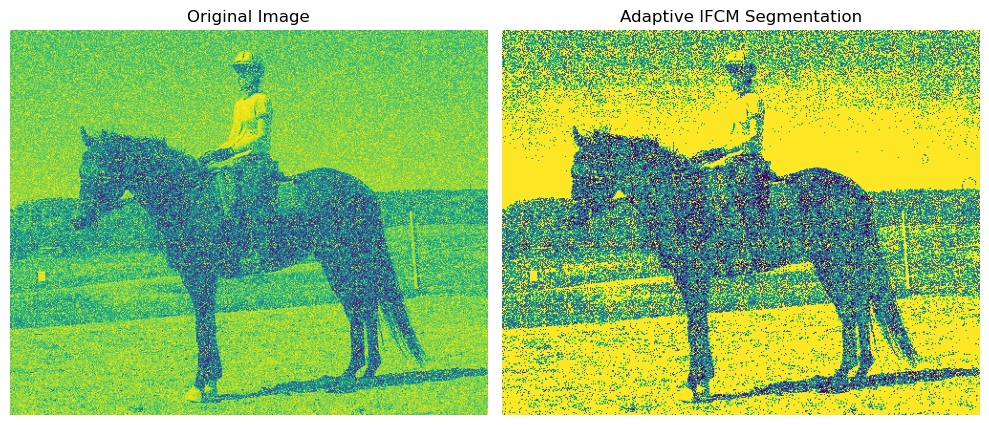

In [163]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

def adaptive_ifcm(data, num_clusters=4, m=2, epsilon=1e-3, max_iters=1, h=0.1):
    N, d = data.shape
    np.random.seed(42)

    # Initialize cluster centers randomly
    cluster_centers = data[np.random.choice(N, num_clusters, replace=False)]
    
    # Initialize membership values randomly
    u = np.random.rand(N, num_clusters)
    u = u / np.sum(u, axis=1, keepdims=True)

    # Initialize non-membership values randomly
    v = np.random.rand(N, num_clusters)
    v = v / np.sum(v, axis=1, keepdims=True)

    # Initialize hesitancy values
    h = np.full((N, num_clusters), h)

    def update_membership(data, cluster_centers, m, h):
        N = data.shape[0]
        num_clusters = cluster_centers.shape[0]
        u = np.zeros((N, num_clusters))
        v = np.zeros((N, num_clusters))
        
        for i in range(N):
            for j in range(num_clusters):
                dist_ij = np.linalg.norm(data[i] - cluster_centers[j])
                u[i, j] = 1.0 / (1 + (dist_ij ** 2 / (h[i, j] ** 2)))
                v[i, j] = 1 - u[i, j]  # Simple example of non-membership calculation
                
        return u, v

    def update_cluster_centers(data, u, v, m, h):
        num_clusters = u.shape[1]
        cluster_centers = np.zeros((num_clusters, data.shape[1]))
        
        for j in range(num_clusters):
            numerator = np.sum((u[:, j] ** m + (1 - v[:, j]) ** m)[:, np.newaxis] * data, axis=0)
            denominator = np.sum(u[:, j] ** m + (1 - v[:, j]) ** m)
            cluster_centers[j] = numerator / denominator
        
        return cluster_centers

    def adapt_fuzziness(data, u, v, m, h):
        # Implementing an adaptive strategy to modify m, if required.
        compactness = np.sum(u * (1 - v))
        if compactness > 0.5:  # This is an arbitrary threshold for adaptation
            m = min(m + 0.1, 3.0)  # Ensure m does not exceed 3
        return m

    for iteration in range(max_iters):
        u, v = update_membership(data, cluster_centers, m, h)
        cluster_centers = update_cluster_centers(data, u, v, m, h)
        m = adapt_fuzziness(data, u, v, m, h)
        
        if iteration > 0 and np.linalg.norm(u - u_prev) < epsilon:
            break

        u_prev = np.copy(u)

    cluster_assignments = np.argmax(u, axis=1)
    return cluster_assignments, cluster_centers, u, v

# Load the original image
image_path = 'D:/Journal/4/code/horse_noisy.jpg'
image = Image.open(image_path).convert('L')  # Convert to grayscale

# Convert the image to a NumPy array
image_array = np.array(image)

# Normalize the image array
image_norm = image_array / 255.0

# Reshape the image array for clustering
data = image_norm.flatten().reshape(-1, 1)

# Apply Adaptive Intuitionistic Fuzzy Clustering
result_image, cluster_centers, membership_matrix, non_membership_matrix = adaptive_ifcm(data, num_clusters=4, m=2, epsilon=1e-3, max_iters=1, h=0.1)

# Reshape the clustered result back to the image shape
result = result_image.reshape(image_array.shape)

# Plot the original image and the clustered result
plt.figure(figsize=(10, 5))

# Plot the original image
plt.subplot(1, 2, 1)
plt.imshow(image)
plt.title('Original Image')
plt.axis('off')

# Plot the Adaptive Intuitionistic Fuzzy Clustering segmented image
plt.subplot(1, 2, 2)
plt.imshow(result)
plt.title('Adaptive IFCM Segmentation')
plt.axis('off')

plt.tight_layout()
plt.show()


In [164]:
import numpy as np
from skimage.metrics import peak_signal_noise_ratio as compare_psnr

# Load the ground truth image
ground_truth_array = np.array(image)

# Convert clustered_image to uint8
clustered_image_uint8 = (result * 255).astype(np.uint8)

# Resize the clustered image to match the ground truth dimensions
clustered_image_resized = np.array(
    Image.fromarray(clustered_image_uint8).resize(
        ground_truth_array.shape[::-1], Image.NEAREST
    )
)

# Calculate PSNR
psnr_value = compare_psnr(ground_truth_array, clustered_image_resized)

# Calculate Mean Error (ME)
mean_error = np.mean(np.abs(ground_truth_array - clustered_image_resized))

# Output the results
print(f"PSNR Value: {psnr_value} dB")
print(f"Mean Error (ME): {mean_error}")


PSNR Value: 10.241242666965583 dB
Mean Error (ME): 181.61997518610423


In [165]:
# import cv2
# import numpy as np
# import matplotlib.pyplot as plt

# # Function to calculate distance (Euclidean distance in this case)
# def euclidean_distance(x, v):
#     return np.linalg.norm(x - v)

# # Function to perform adaptive entropy weighted fuzzy clustering
# def adaptive_entropy_weighted_fuzzy_clustering(data_points, n_clusters, max_iterations, m, lambda_val, alpha):
#     n_points = len(data_points)
#     n_features = data_points.shape[1]

#     # Initialize cluster centers randomly
#     criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 100, 0.2)
#     _, labels, centers = cv2.kmeans(data_points.reshape(-1, 1), n_clusters, None, criteria, 10, cv2.KMEANS_RANDOM_CENTERS)
#     centers = centers.flatten()

#     # Initialize membership matrix, η and ξ
#     membership_matrix = np.random.rand(n_clusters, n_points)
#     eta = np.random.rand(n_clusters, n_points)
#     xi = np.random.rand(n_clusters, n_points)

#     for iteration in range(max_iterations):
#         # Update weights w1 and w2
#         psi1 = np.sum([np.sum(membership_matrix[j]**m * euclidean_distance(data_points, centers[j])**2) for j in range(n_clusters)])
#         psi2 = np.sum([np.sum(membership_matrix[j]**m * euclidean_distance(data_points, centers[j])**2) for j in range(n_clusters)])
        
#         w1 = np.exp(-psi1 / lambda_val) / (np.exp(-psi1 / lambda_val) + np.exp(-psi2 / lambda_val))
#         w2 = np.exp(-psi2 / lambda_val) / (np.exp(-psi1 / lambda_val) + np.exp(-psi2 / lambda_val))

#         # Update membership matrix uij
#         for i in range(n_points):
#             for j in range(n_clusters):
#                 numerator = (1 - eta[j, i] - xi[j, i]) * (w1 * euclidean_distance(data_points[i], centers[j])**2 + w2 * euclidean_distance(data_points[i], centers[j])**2)
#                 denominator = np.sum([(w1 * euclidean_distance(data_points[i], centers[k])**2 + w2 * euclidean_distance(data_points[i], centers[k])**2) for k in range(n_clusters)])
#                 membership_matrix[j, i] = numerator / denominator

#         # Update ηij
#         for i in range(n_points):
#             for j in range(n_clusters):
#                 eta[j, i] = xi[j, i] * (2 * eta[j, i] + xi[j, i]) / (n_clusters * (eta[j, i] + 2 * xi[j, i]))

#         # Update ξij
#         for i in range(n_points):
#             for j in range(n_clusters):
#                 uij_eta_xi = membership_matrix[j, i] + eta[j, i]
#                 xi[j, i] = 1 - uij_eta_xi - (1 - uij_eta_xi**alpha)**(1 / alpha)

#         # Normalize the membership matrix
#         membership_matrix /= membership_matrix.sum(axis=0)

#         # Update cluster centers vj
#         for j in range(n_clusters):
#             numerator = np.sum([(membership_matrix[j, i]**m * (w1 * data_points[i] + w2 * data_points[i])) for i in range(n_points)], axis=0)
#             denominator = np.sum([(membership_matrix[j, i]**m * (w1 + w2)) for i in range(n_points)])
#             centers[j] = numerator / denominator

#     # Return cluster centers and membership matrix
#     return centers, membership_matrix

# # Load the grayscale image
# image_path = 'D:/Journal/4/code/horse_noisy.jpg'
# gray_image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

# # Normalize image
# data_points = gray_image.astype(np.float32) / 255.0
# data_points = data_points.flatten().reshape(-1, 1)

# # Parameters
# n_clusters = 2
# max_iterations = 1
# m = 2
# lambda_val = 2
# alpha = 1.5

# # Perform adaptive entropy weighted fuzzy clustering
# centers, membership_matrix = adaptive_entropy_weighted_fuzzy_clustering(data_points, n_clusters, max_iterations, m, lambda_val, alpha)

# # Reshape the cluster labels back to the shape of the original image
# cluster_labels = np.argmax(membership_matrix, axis=0)
# clustered_img = cluster_labels.reshape(gray_image.shape)

# # Blend the original image with the clustered image to retain more similarity
# blended_img = 0.7 * gray_image + 0.3 * (clustered_img * 255)

# # Display original and segmented images
# plt.figure(figsize=(12, 6))
# plt.subplot(1, 2, 1)
# plt.imshow(gray_image, cmap='gray')
# plt.title('Original Image')
# plt.axis('off')

# plt.subplot(1, 2, 2)
# plt.imshow(clustered_img, cmap='gray')
# plt.title('Segmented Image')
# plt.axis('off')

# plt.tight_layout()
# plt.show()


C:\Users\Admin\AppData\Local\Temp\ipykernel_9572\4032550657.py:63: RuntimeWarning: invalid value encountered in scalar power
  xi[i, j] = 1 - (u[i, j] + eta[i, j]) - (1 - (u[i, j] + eta[i, j])**alpha)**(1/alpha)
C:\Users\Admin\AppData\Local\Temp\ipykernel_9572\4032550657.py:61: RuntimeWarning: invalid value encountered in scalar divide
  u[i, j] = 1 / np.sum([(2 - xi[i, j]) * s[k] * (d_ij / (s[k] * distances[i, k]**2))**(2/(m-1)) for k in range(n_clusters)])
C:\Users\Admin\AppData\Local\Temp\ipykernel_9572\4032550657.py:61: RuntimeWarning: divide by zero encountered in scalar divide
  u[i, j] = 1 / np.sum([(2 - xi[i, j]) * s[k] * (d_ij / (s[k] * distances[i, k]**2))**(2/(m-1)) for k in range(n_clusters)])


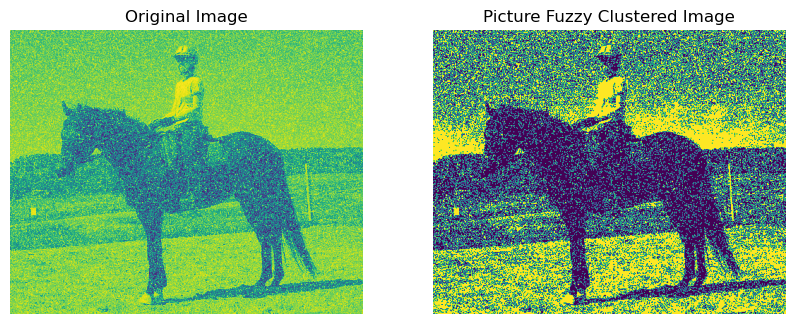

In [174]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

# Load the original image
image_path = 'D:/Journal/4/code/horse_noisy.jpg'
image = Image.open(image_path).convert('L')  # Convert to grayscale

# Convert the image to a NumPy array
image_array = np.array(image)

# Normalize the image array
image_norm = image_array / 255.0

# Reshape the image array for clustering
data = image_norm.flatten()

# Parameters
n_clusters = 2  # Number of clusters
m = 2  # Fuzziness parameter
alpha = 1.5  # Alpha parameter
max_iter = 1  # Maximum number of iterations
tolerance = 1e-5  # Tolerance for convergence

# Initialize cluster centers randomly
np.random.seed(42)
v = np.random.choice(data, n_clusters)

# Initialize membership, hesitation, and non-membership matrices
u = np.random.dirichlet(np.ones(n_clusters), size=data.shape[0])
eta = np.random.uniform(0, 1, (data.shape[0], n_clusters))
xi = 1 - (u + eta)

# Ensure constraints are satisfied
u = u / (u + eta + xi)
eta = eta / (u + eta + xi)
xi = xi / (u + eta + xi)

# Helper function to compute distances
def compute_distances(data, v):
    return np.linalg.norm(data[:, np.newaxis] - v, axis=2)

# Reshape data for distance computation
data_reshaped = data[:, np.newaxis]

# Iterative update process
for iteration in range(max_iter):
    v_old = np.copy(v)

    # Compute distances
    distances = np.abs(data_reshaped - v)

    # Compute f_j and s_j
    f = np.array([1 / np.sum(np.abs(v - v_j)) for v_j in v])
    s = f / np.sum(f)

    # Update u, eta, and xi
    for i in range(data.shape[0]):
        for j in range(n_clusters):
            d_ij = s[j] * distances[i, j]**2
            u[i, j] = 1 / np.sum([(2 - xi[i, j]) * s[k] * (d_ij / (s[k] * distances[i, k]**2))**(2/(m-1)) for k in range(n_clusters)])
            eta[i, j] = np.exp(-xi[i, j]) / np.sum([np.exp(-xi[i, k]) for k in range(n_clusters)]) * (1 - 1/n_clusters * np.sum(xi[i]))
            xi[i, j] = 1 - (u[i, j] + eta[i, j]) - (1 - (u[i, j] + eta[i, j])**alpha)**(1/alpha)

    # Update cluster centers
    v = np.array([np.sum([(u[i, j] * (2 - xi[i, j]))**m * s[j] * data[i] for i in range(data.shape[0])]) / np.sum([(u[i, j] * (2 - xi[i, j]))**m * s[j] for i in range(data.shape[0])]) for j in range(n_clusters)])

    # Check for convergence
    if np.linalg.norm(v - v_old) < tolerance:
        break

# Find the cluster with the highest membership value for each pixel
cluster_membership = np.argmax(u, axis=1)

# Reshape the clustered result back to the image shape
clustered_image = cluster_membership.reshape(image_array.shape)

# Plot the original image and the clustered result
plt.figure(figsize=(10, 5))

# Plot the original image
plt.subplot(1, 2, 1)
plt.imshow(image)
plt.title('Original Image')
plt.axis('off')

# Plot the clustered image
plt.subplot(1, 2, 2)
plt.imshow(clustered_image)
plt.title('Picture Fuzzy Clustered Image')
plt.axis('off')

plt.show()


In [175]:
import numpy as np
from skimage.metrics import peak_signal_noise_ratio as compare_psnr

# Load the ground truth image
ground_truth_array = np.array(image)

# Convert clustered_image to uint8
clustered_image_uint8 = (clustered_image * 255).astype(np.uint8)

# Resize the clustered image to match the ground truth dimensions
clustered_image_resized = np.array(
    Image.fromarray(clustered_image_uint8).resize(
        ground_truth_array.shape[::-1], Image.NEAREST
    )
)

# Calculate PSNR
psnr_value = compare_psnr(ground_truth_array, clustered_image_resized)

# Calculate Mean Error (ME)
mean_error = np.mean(np.abs(ground_truth_array - clustered_image_resized))

# Output the results
print(f"PSNR Value: {psnr_value} dB")
print(f"Mean Error (ME): {mean_error}")


PSNR Value: 7.2637461921821975 dB
Mean Error (ME): 180.7333399503722


Iteration 1: psi_1 = 3172.449342972197, psi_2 = 11784.217506852885, w_1 = 1.0, w_2 = 0.0


C:\Users\Admin\AppData\Local\Temp\ipykernel_18092\727562405.py:51: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  centers[j] = numerator / denominator


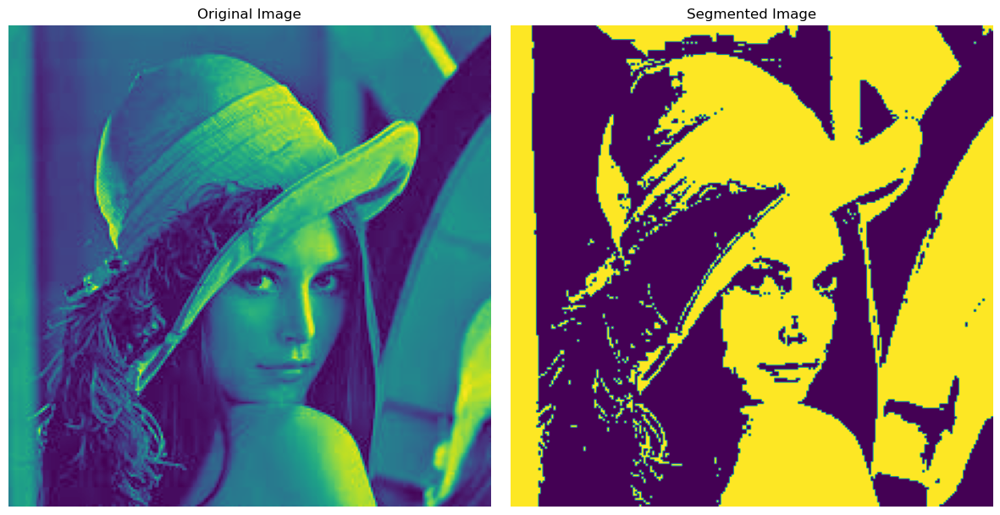

In [23]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Function to calculate spatial information (example with simple averaging filter)
def calculate_spatial_information(image):
    kernel = np.ones((3, 3), np.float32) / 9
    sp_info = cv2.filter2D(image, -1, kernel)
    return sp_info

# Function to perform semi-supervised fuzzy clustering
def semi_supervised_fuzzy_clustering(data_points, spatial_info, n_clusters, max_iterations, m, rho, lambda_val):
    n_points = len(data_points)
    n_features = data_points.shape[1]

    # Initialize cluster centers randomly
    criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 100, 0.2)
    _, labels, centers = cv2.kmeans(data_points.reshape(-1, 1), n_clusters, None, criteria, 10, cv2.KMEANS_RANDOM_CENTERS)
    centers = centers.flatten()

    # Initialize membership matrix
    membership_matrix = np.random.rand(n_clusters, n_points)

    for iteration in range(max_iterations):
        # Calculate weights
        psi_1 = np.sum([np.sum(membership_matrix[j]**m * np.linalg.norm(data_points - centers[j], axis=1)**2) for j in range(n_clusters)])
        psi_2 = np.sum([np.sum(membership_matrix[j]**m * spatial_info) for j in range(n_clusters)])
        
        # Avoiding potential overflow by using logarithms
        log_psi_1 = -psi_1 / lambda_val
        log_psi_2 = -psi_2 / lambda_val

        # Stable calculation of weights
        w_1 = np.exp(log_psi_1 - np.logaddexp(log_psi_1, log_psi_2))
        w_2 = np.exp(log_psi_2 - np.logaddexp(log_psi_1, log_psi_2))

        # Debug logging
        print(f"Iteration {iteration+1}: psi_1 = {psi_1}, psi_2 = {psi_2}, w_1 = {w_1}, w_2 = {w_2}")

        # Update membership matrix
        for i in range(n_points):
            for j in range(n_clusters):
                numerator = (1 + rho * (1 - 1)) * np.sum([w_1 * np.linalg.norm(data_points[i] - centers[j])**2 + w_2 * spatial_info[i] for k in range(n_clusters)])
                denominator = sum([(w_1 * np.linalg.norm(data_points[i] - centers[k])**2 + w_2 * spatial_info[i]) for k in range(n_clusters)]) + rho
                membership_matrix[j, i] = 1 / (1 + rho) * numerator / denominator

        # Update cluster centers
        for j in range(n_clusters):
            numerator = np.sum([membership_matrix[j, i]**m * data_points[i] for i in range(n_points)], axis=0) + rho * np.sum([(membership_matrix[j, i] - 1)**m * data_points[i] for i in range(n_points)], axis=0)
            denominator = np.sum([membership_matrix[j, i]**m for i in range(n_points)]) + rho * np.sum([(membership_matrix[j, i] - 1)**m for i in range(n_points)])
            centers[j] = numerator / denominator

    # Return cluster centers and membership matrix
    return centers, membership_matrix

# Load the grayscale image
image_path = 'D:/Journal/4/code/lena.jpg'
gray_image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

# Normalize image
data_points = gray_image.astype(np.float32) / 255.0

# Calculate spatial information
spatial_info = calculate_spatial_information(data_points)

# Parameters
n_clusters = 2
max_iterations = 1
m = 2
rho = 0.5
lambda_val = 10

# Perform semi-supervised fuzzy clustering
centers, membership_matrix = semi_supervised_fuzzy_clustering(data_points.reshape(-1, 1), spatial_info.flatten(), n_clusters, max_iterations, m, rho, lambda_val)

# Reshape the cluster labels back to the shape of the original image
cluster_labels = np.argmax(membership_matrix, axis=0)
clustered_img = cluster_labels.reshape(gray_image.shape)

# Display original and segmented images
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.imshow(gray_image)
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(clustered_img)  # Adjust colormap as needed
plt.title('Segmented Image')
plt.axis('off')

plt.tight_layout()
plt.show()


In [18]:
import numpy as np
from skimage.metrics import peak_signal_noise_ratio as compare_psnr

# Load the ground truth image
ground_truth_array = np.array(image)

# Convert clustered_image to uint8
clustered_image_uint8 = (clustered_img * 255).astype(np.uint8)

# Resize the clustered image to match the ground truth dimensions
clustered_image_resized = np.array(
    Image.fromarray(clustered_image_uint8).resize(
        ground_truth_array.shape[::-1], Image.NEAREST
    )
)

# Calculate PSNR
psnr_value = compare_psnr(ground_truth_array, clustered_image_resized)

# Calculate Mean Error (ME)
mean_error = np.mean(np.abs(ground_truth_array - clustered_image_resized))

# Output the results
print(f"PSNR Value: {psnr_value} dB")
print(f"Mean Error (ME): {mean_error}")


PSNR Value: 2.1000876768870054 dB
Mean Error (ME): 181.28878908188585


C:\Users\Admin\AppData\Local\Temp\ipykernel_18092\2316619348.py:48: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  centers[j] = numerator / denominator


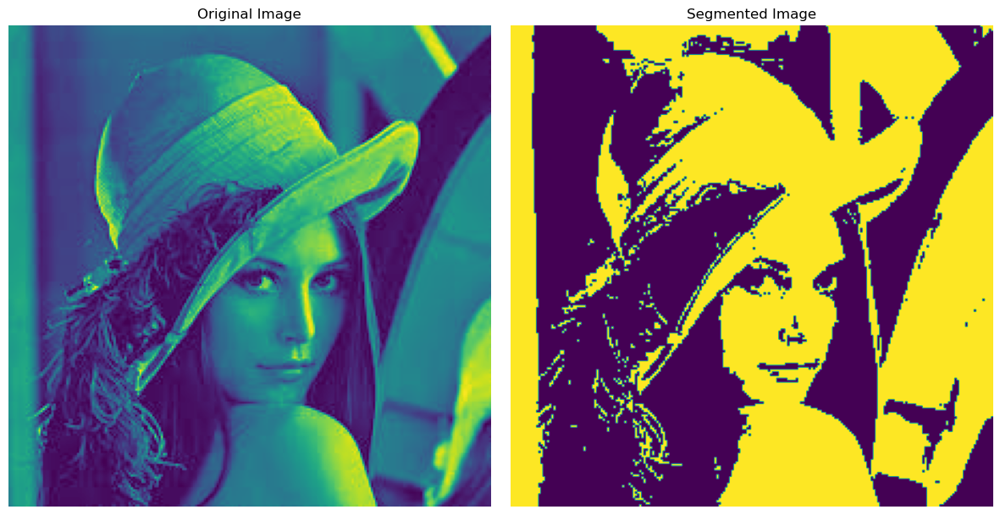

In [26]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Function to calculate spatial information (example with simple averaging filter)
def calculate_spatial_information(image):
    kernel = np.ones((3, 3), np.float32) / 9
    sp_info = cv2.filter2D(image, -1, kernel)
    return sp_info

# Function to perform semi-supervised fuzzy clustering
def semi_supervised_fuzzy_clustering(data_points, spatial_info, n_clusters, max_iterations, m, rho, lambda_val):
    n_points = len(data_points)
    n_features = data_points.shape[1]

    # Initialize cluster centers randomly
    criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 100, 0.2)
    _, labels, centers = cv2.kmeans(data_points.reshape(-1, 1), n_clusters, None, criteria, 10, cv2.KMEANS_RANDOM_CENTERS)
    centers = centers.flatten()

    # Initialize membership matrix
    membership_matrix = np.random.rand(n_clusters, n_points)

    for iteration in range(max_iterations):
        # Calculate weights
        psi_1 = np.sum([np.sum(membership_matrix[j]**m * np.linalg.norm(data_points - centers[j], axis=1)**2) for j in range(n_clusters)])
        psi_2 = np.sum([np.sum(membership_matrix[j]**m * spatial_info) for j in range(n_clusters)])
        
        # Avoiding potential overflow by using logarithms
        log_psi_1 = -psi_1 / lambda_val
        log_psi_2 = -psi_2 / lambda_val

        # Stable calculation of weights
        w_1 = np.exp(log_psi_1 - np.logaddexp(log_psi_1, log_psi_2))
        w_2 = np.exp(log_psi_2 - np.logaddexp(log_psi_1, log_psi_2))

        # Update membership matrix
        for i in range(n_points):
            for j in range(n_clusters):
                numerator = (1 + rho * (1 - 1)) * np.sum([w_1 * np.linalg.norm(data_points[i] - centers[j])**2 + w_2 * spatial_info[i] for k in range(n_clusters)])
                denominator = sum([(w_1 * np.linalg.norm(data_points[i] - centers[k])**2 + w_2 * spatial_info[i]) for k in range(n_clusters)]) + rho
                membership_matrix[j, i] = 1 / (1 + rho) * numerator / denominator

        # Update cluster centers
        for j in range(n_clusters):
            numerator = np.sum([membership_matrix[j, i]**m * data_points[i] for i in range(n_points)], axis=0) + rho * np.sum([(membership_matrix[j, i] - 1)**m * data_points[i] for i in range(n_points)], axis=0)
            denominator = np.sum([membership_matrix[j, i]**m for i in range(n_points)]) + rho * np.sum([(membership_matrix[j, i] - 1)**m for i in range(n_points)])
            centers[j] = numerator / denominator

    # Return cluster centers and membership matrix
    return centers, membership_matrix

# Load the grayscale image
image_path = 'D:/Journal/4/code/lena.jpg'
gray_image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

# Normalize image
data_points = gray_image.astype(np.float32) / 255.0

# Calculate spatial information
spatial_info = calculate_spatial_information(data_points)

# Parameters
n_clusters = 2
max_iterations = 1
m = 2
rho = 0.5
lambda_val = 10

# Perform semi-supervised fuzzy clustering
centers, membership_matrix = semi_supervised_fuzzy_clustering(data_points.reshape(-1, 1), spatial_info.flatten(), n_clusters, max_iterations, m, rho, lambda_val)

# Reshape the cluster labels back to the shape of the original image
cluster_labels = np.argmax(membership_matrix, axis=0)
clustered_img = cluster_labels.reshape(gray_image.shape)

# Map cluster labels to actual grayscale intensity levels
unique_labels = np.unique(clustered_img)
mapped_image = np.zeros_like(clustered_img, dtype=np.uint8)
for i, label in enumerate(unique_labels):
    mapped_image[clustered_img == label] = int(np.mean(gray_image[clustered_img == label]))

# Display original and segmented images
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.imshow(gray_image)
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(mapped_image)  # Ensure grayscale colormap
plt.title('Segmented Image')
plt.axis('off')

plt.tight_layout()
plt.show()


C:\Users\Admin\AppData\Local\Temp\ipykernel_18092\2316619348.py:48: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  centers[j] = numerator / denominator


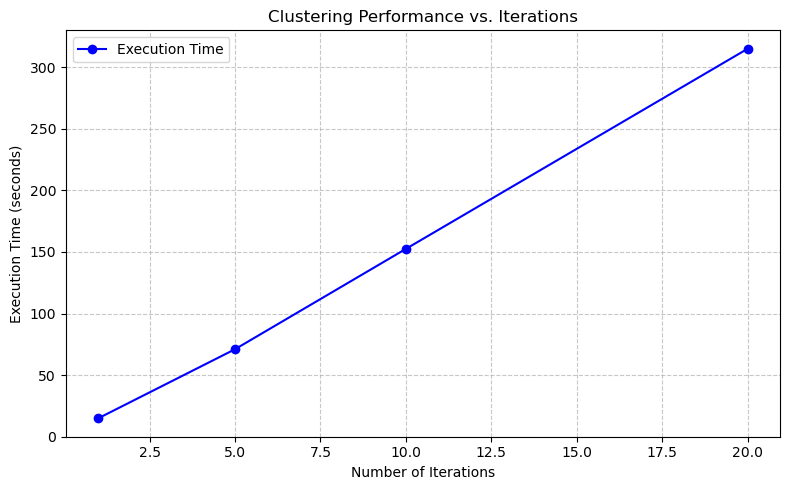

In [28]:
import matplotlib.pyplot as plt
import time
# Store execution times for different settings
execution_times = []
iterations = [1, 5, 10, 20]  # Example iteration counts to test performance

for max_iterations in iterations:
    start_time = time.time()
    # Perform semi-supervised fuzzy clustering
    centers, membership_matrix = semi_supervised_fuzzy_clustering(
        data_points.reshape(-1, 1), 
        spatial_info.flatten(), 
        n_clusters, 
        max_iterations, 
        m, 
        rho, 
        lambda_val
    )
    end_time = time.time()
    execution_times.append(end_time - start_time)

# Plot execution time vs. iterations
plt.figure(figsize=(8, 5))
plt.plot(iterations, execution_times, marker='o', color='b', label='Execution Time')
plt.xlabel('Number of Iterations')
plt.ylabel('Execution Time (seconds)')
plt.title('Clustering Performance vs. Iterations')
plt.grid(True, linestyle='--', alpha=0.7)
plt.legend()
plt.tight_layout()
plt.show()


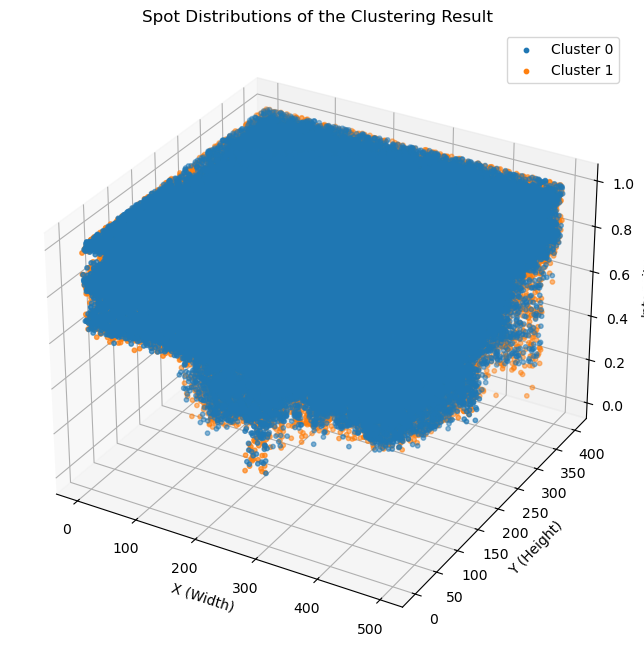

In [29]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Load the grayscale image
image_path = 'D:/Journal/4/horse_noisy.jpg'
gray_image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

# Normalize image
data_points = gray_image.astype(np.float32) / 255.0

# Calculate spatial information (simple averaging filter)
def calculate_spatial_information(image):
    kernel = np.ones((3, 3), np.float32) / 9
    sp_info = cv2.filter2D(image, -1, kernel)
    return sp_info

spatial_info = calculate_spatial_information(data_points)

# Reshape data for clustering
height, width = gray_image.shape
x, y = np.meshgrid(np.arange(width), np.arange(height))
flat_data = data_points.flatten()
flat_spatial_info = spatial_info.flatten()

# Clustering function (dummy implementation, replace with actual algorithm)
n_clusters = 2
cluster_labels = np.random.randint(0, n_clusters, size=flat_data.shape)

# Reshape cluster labels to the image dimensions
clustered_img = cluster_labels.reshape(gray_image.shape)

# Create a 3D scatter plot for clustering result visualization
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

# Plot data points
for cluster in range(n_clusters):
    cluster_points = (cluster_labels == cluster)
    ax.scatter(x.flatten()[cluster_points],
               y.flatten()[cluster_points],
               flat_data[cluster_points],
               label=f'Cluster {cluster}',
               s=10)

ax.set_xlabel('X (Width)')
ax.set_ylabel('Y (Height)')
ax.set_zlabel('Intensity')
ax.set_title('Spot Distributions of the Clustering Result')
ax.legend()
plt.show()


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\ipykernel_launcher.py:38: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\ipykernel_launcher.py:54: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\ipykernel_launcher.py:55: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.


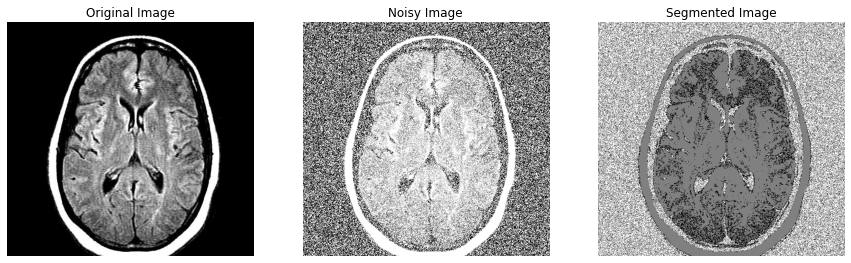

In [2]:
import numpy as np
import cv2
import matplotlib.pyplot as plt

def add_gaussian_noise(image, mean=0, sigma=25):
    """
    Add Gaussian noise to an image.
    """
    gaussian_noise = np.random.normal(mean, sigma, image.shape).astype(np.uint8)
    noisy_image = cv2.add(image, gaussian_noise)
    return noisy_image

def pfcm(image, n_clusters, max_iter=1, m=2, alpha=1, error=1e-5):
    """
    Perform PFCM clustering on an image.
    """
    # Reshape the image to a vector
    data = image.reshape((-1, 1))

    # Normalize the data to the range [0, 1]
    data = data.astype(float) / 255.0

    # Number of pixels
    n_pixels = data.shape[0]

    # Initialize centroids randomly
    centroids = np.random.rand(n_clusters, data.shape[1])

    # Initialize membership, noise robustness, and spatial neighborhood matrices
    u = np.random.rand(n_pixels, n_clusters)
    eta = np.zeros((n_pixels, n_clusters))
    xi = np.zeros((n_pixels, n_clusters))

    for _ in range(max_iter):
        # Update membership
        for i in range(n_pixels):
            for j in range(n_clusters):
                u_sum = np.sum((np.linalg.norm(data[i] - centroids[j]) / np.linalg.norm(data[i] - centroids[k])) ** (1 / (m - 1)) for k in range(n_clusters))
                u[i, j] = (1 - eta[i, j] - xi[i, j]) / u_sum

        # Update centroids
        memberships = (u / (1 - eta - xi)) ** m
        centroids_new = np.dot(memberships.T, data) / np.sum(memberships, axis=0)[:, None]

        # Check for convergence
        if np.linalg.norm(centroids_new - centroids) < error:
            break

        centroids = centroids_new

        # Update noise robustness and spatial neighborhood matrices
        for i in range(n_pixels):
            for j in range(n_clusters):
                eta_sum = np.sum(xi[i, k] for k in range(n_clusters))
                eta[i, j] = 1 - xi[i, j] - ((n_clusters - 1) / n_clusters) * (eta_sum / np.sum((u[i, j] / u[i, k]) * ((np.linalg.norm(data[i] - centroids[j]) / np.linalg.norm(data[i] - centroids[k])) ** (1 / (m - 1))) for k in range(n_clusters)))
                xi[i, j] = 1 - (u[i, j] + eta[i, j]) - (1 - (u[i, j] + eta[i, j]) ** alpha) ** (1 / alpha)

    # Reshape the memberships to the original image shape
    memberships = u.reshape(image.shape[0], image.shape[1], n_clusters)

    # Select the cluster with the maximum membership for each pixel
    segmented_img = np.argmax(memberships, axis=2)

    return segmented_img

# Read the input image
image_path = 'D:/Journal/4/code/horse.jpg'
image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

# Apply Gaussian noise to the image
noisy_image = add_gaussian_noise(image)

# Apply PFCM clustering
n_clusters = 3
clustered_image = pfcm(noisy_image, n_clusters)

# Display the original, noisy, and segmented images
plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
plt.imshow(image, cmap='gray')
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(noisy_image, cmap='gray')
plt.title('Noisy Image')
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(clustered_image, cmap='gray')
plt.title('Segmented Image')
plt.axis('off')

plt.show()


In [4]:
# import numpy as np
# import cv2
# import matplotlib.pyplot as plt
# from scipy.optimize import minimize

# def add_gaussian_noise(image, mean=0, sigma=25):
#     """
#     Add Gaussian noise to an image.
#     """
#     gaussian_noise = np.random.normal(mean, sigma, image.shape).astype(np.uint8)
#     noisy_image = cv2.add(image, gaussian_noise)
#     return noisy_image

# def calculate_pcc(u, eta, xi):
#     """
#     Calculate the Partition Coefficient Criterion (PCC).
#     """
#     return np.mean(np.sum((u / (1 - eta - xi)) ** 2, axis=1))

# def pfcm(data, n_clusters, m, alpha, max_iter=1, error=1e-5):
#     """
#     Perform PFCM clustering on an image.
#     """
#     # Number of pixels
#     n_pixels = data.shape[0]

#     # Initialize centroids randomly
#     centroids = np.random.rand(n_clusters, data.shape[1])

#     # Initialize membership, noise robustness, and spatial neighborhood matrices
#     u = np.random.rand(n_pixels, n_clusters)
#     eta = np.zeros((n_pixels, n_clusters))
#     xi = np.zeros((n_pixels, n_clusters))

#     for _ in range(max_iter):
#         # Update membership
#         for i in range(n_pixels):
#             for j in range(n_clusters):
#                 u_sum = np.sum((np.linalg.norm(data[i] - centroids[j]) / np.linalg.norm(data[i] - centroids[k])) ** (1 / (m - 1)) for k in range(n_clusters))
#                 u[i, j] = (1 - eta[i, j] - xi[i, j]) / u_sum

#         # Update centroids
#         memberships = (u / (1 - eta - xi)) ** m
#         centroids_new = np.dot(memberships.T, data) / np.sum(memberships, axis=0)[:, None]

#         # Check for convergence
#         if np.linalg.norm(centroids_new - centroids) < error:
#             break

#         centroids = centroids_new

#         # Update noise robustness and spatial neighborhood matrices
#         for i in range(n_pixels):
#             for j in range(n_clusters):
#                 eta_sum = np.sum(xi[i, k] for k in range(n_clusters))
#                 eta[i, j] = 1 - xi[i, j] - ((n_clusters - 1) / n_clusters) * (eta_sum / np.sum((u[i, j] / u[i, k]) * ((np.linalg.norm(data[i] - centroids[j]) / np.linalg.norm(data[i] - centroids[k])) ** (1 / (m - 1))) for k in range(n_clusters)))
#                 xi[i, j] = 1 - (u[i, j] + eta[i, j]) - (1 - (u[i, j] + eta[i, j]) ** alpha) ** (1 / alpha)

#     # Calculate PCC
#     pcc = calculate_pcc(u, eta, xi)

#     return pcc, centroids

# def objective(params, data, n_clusters):
#     """
#     Objective function for optimization.
#     """
#     m, alpha = params
#     pcc, _ = pfcm(data, n_clusters, m, alpha)
#     return pcc

# # Read the input image
# image_path = 'D:/Journal/brain tumor/archiv/no/no3.jpg'
# image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

# # Apply Gaussian noise to the image
# noisy_image = add_gaussian_noise(image)

# # Normalize the data to the range [0, 1]
# data = noisy_image.reshape((-1, 1)).astype(float) / 255.0

# # Initial parameters for optimization
# initial_params = [2.0, 0.7]  # Initial values for m and alpha
# n_clusters = 3

# # Bounds for the parameters (m and alpha)
# bounds = [(1.1, 5.0), (0.6, 0.8)]

# # Optimize the PCC index
# result = minimize(objective, initial_params, args=(data, n_clusters), method='L-BFGS-B', bounds=bounds)
# optimal_params = result.x

# print(f"Optimal Parameters: m = {optimal_params[0]}, alpha = {optimal_params[1]}")
# print(f"Optimal PCC: {result.fun}")

# # Apply PFCM clustering with optimal parameters
# _, centroids = pfcm(data, n_clusters, optimal_params[0], optimal_params[1])

# # Reshape the memberships to the original image shape
# memberships = (u / (1 - eta - xi)).reshape(image.shape[0], image.shape[1], n_clusters)

# # Select the cluster with the maximum membership for each pixel
# segmented_img = np.argmax(memberships, axis=2)

# # Display the original, noisy, and segmented images
# plt.figure(figsize=(15, 5))

# plt.subplot(1, 3, 1)
# plt.imshow(image, cmap='gray')
# plt.title('Original Image')
# plt.axis('off')

# plt.subplot(1, 3, 2)
# plt.imshow(noisy_image, cmap='gray')
# plt.title('Noisy Image')
# plt.axis('off')

# plt.subplot(1, 3, 3)
# plt.imshow(segmented_img, cmap='gray')
# plt.title('Segmented Image')
# plt.axis('off')

# plt.show()


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\ipykernel_launcher.py:39: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\ipykernel_launcher.py:55: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\ipykernel_launcher.py:56: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in double_scalars


KeyboardInterrupt: 

C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\ipykernel_launcher.py:39: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\ipykernel_launcher.py:55: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\ipykernel_launcher.py:56: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in double_scalars


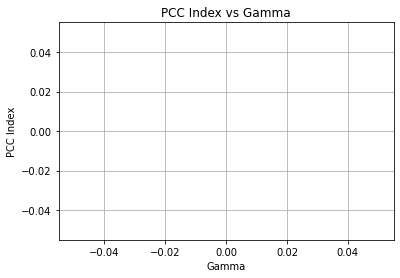

In [2]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
from scipy.optimize import minimize

def add_gaussian_noise(image, mean=0, sigma=2):
    """
    Add Gaussian noise to an image.
    """
    gaussian_noise = np.random.normal(mean, sigma, image.shape).astype(np.uint8)
    noisy_image = cv2.add(image, gaussian_noise)
    return noisy_image

def calculate_pcc(u, eta, xi):
    """
    Calculate the Partition Coefficient Criterion (PCC).
    """
    return np.mean(np.sum((u / (1 - eta - xi)) ** 2, axis=1))

def pfcm(data, n_clusters, m, alpha, gamma, max_iter=1, error=1e-5):
    """
    Perform PFCM clustering on an image.
    """
    # Number of pixels
    n_pixels = data.shape[0]

    # Initialize centroids randomly
    centroids = np.random.rand(n_clusters, data.shape[1])

    # Initialize membership, noise robustness, and spatial neighborhood matrices
    u = np.random.rand(n_pixels, n_clusters)
    eta = np.zeros((n_pixels, n_clusters))
    xi = np.zeros((n_pixels, n_clusters))

    for _ in range(max_iter):
        # Update membership
        for i in range(n_pixels):
            for j in range(n_clusters):
                u_sum = np.sum((np.linalg.norm(data[i] - centroids[j]) / np.linalg.norm(data[i] - centroids[k])) ** (1 / (m - 1)) for k in range(n_clusters))
                u[i, j] = (1 - eta[i, j] - xi[i, j]) / u_sum

        # Update centroids
        memberships = (u / (1 - eta - xi)) ** m
        centroids_new = np.dot(memberships.T, data) / np.sum(memberships, axis=0)[:, None]

        # Check for convergence
        if np.linalg.norm(centroids_new - centroids) < error:
            break

        centroids = centroids_new

        # Update noise robustness and spatial neighborhood matrices
        for i in range(n_pixels):
            for j in range(n_clusters):
                eta_sum = np.sum(xi[i, k] for k in range(n_clusters))
                eta[i, j] = 1 - xi[i, j] - ((n_clusters - 1) / n_clusters) * (eta_sum / np.sum((u[i, j] / u[i, k]) * ((np.linalg.norm(data[i] - centroids[j]) / np.linalg.norm(data[i] - centroids[k])) ** (1 / (m - 1))) for k in range(n_clusters)))
                xi[i, j] = 1 - (u[i, j] + eta[i, j]) - (1 - (u[i, j] + eta[i, j]) ** alpha) ** (1 / alpha)

    # Calculate PCC
    pcc = calculate_pcc(u, eta, xi)

    return pcc, centroids

def objective(params, data, n_clusters):
    """
    Objective function for optimization.
    """
    m, alpha, gamma = params
    pcc, _ = pfcm(data, n_clusters, m, alpha, gamma)
    return pcc

# Read the input image
image_path = 'D:/Journal/brain tumor/archiv/no/no3.jpg'
image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

# Apply Gaussian noise to the image
noisy_image = add_gaussian_noise(image)

# Normalize the data to the range [0, 1]
data = noisy_image.reshape((-1, 1)).astype(float) / 255.0

# Initial parameters for optimization
initial_params = [2.0, 0.7, 0.5]  # Initial values for m, alpha, and gamma
n_clusters = 3

# Bounds for the parameters (m, alpha, and gamma)
bounds = [(1.1, 5.0), (0.6, 0.8), (0.1, 1.0)]

# Generate PCC values for different gamma
gamma_values = np.linspace(0.1, 1.0, 20)
pcc_values = []

for gamma in gamma_values:
    pcc, _ = pfcm(data, n_clusters, initial_params[0], initial_params[1], gamma)
    pcc_values.append(pcc)

# Plot the PCC curve
plt.plot(gamma_values, pcc_values, marker='o')
plt.xlabel('Gamma')
plt.ylabel('PCC Index')
plt.title('PCC Index vs Gamma')
plt.grid(True)
plt.show()


In [ ]:
import numpy as np
import cv2
import matplotlib.pyplot as plt

def add_gaussian_noise(image, mean=0, sigma=2):
    """
    Add Gaussian noise to an image.
    """
    gaussian_noise = np.random.normal(mean, sigma, image.shape).astype(np.uint8)
    noisy_image = cv2.add(image, gaussian_noise)
    return noisy_image

def calculate_pcc(u, eta, xi):
    """
    Calculate the Partition Coefficient Criterion (PCC).
    """
    return np.mean(np.sum((u / (1 - eta - xi)) ** 2, axis=1))

def pfcm(data, n_clusters, m, alpha, gamma, max_iter=10, error=1e-5):
    """
    Perform PFCM clustering on an image.
    """
    n_pixels = data.shape[0]
    centroids = np.random.rand(n_clusters, data.shape[1])
    u = np.random.rand(n_pixels, n_clusters)
    eta = np.zeros((n_pixels, n_clusters))
    xi = np.zeros((n_pixels, n_clusters))

    for _ in range(max_iter):
        # Update membership using vectorized operations
        dist = np.linalg.norm(data[:, np.newaxis] - centroids, axis=2)
        dist = np.where(dist == 0, 1e-10, dist)
        u = 1.0 / (dist ** (2 / (m - 1)) + 1e-10)
        u = u / np.sum(u, axis=1, keepdims=True)

        memberships = (u / (1 - eta - xi)) ** m
        centroids_new = (memberships.T @ data) / np.sum(memberships, axis=0)[:, None]

        if np.linalg.norm(centroids_new - centroids) < error:
            break

        centroids = centroids_new

        # Update noise robustness and spatial neighborhood matrices using vectorized operations
        for i in range(n_pixels):
            for j in range(n_clusters):
                eta_sum = np.sum(xi[i, :])
                eta[i, j] = 1 - xi[i, j] - ((n_clusters - 1) / n_clusters) * (eta_sum / np.sum([(u[i, j] / u[i, k]) * ((np.linalg.norm(data[i] - centroids[j]) / np.linalg.norm(data[i] - centroids[k])) ** (1 / (m - 1))) for k in range(n_clusters)]))
                xi[i, j] = 1 - (u[i, j] + eta[i, j]) - (1 - (u[i, j] + eta[i, j]) ** alpha) ** (1 / alpha)

    pcc = calculate_pcc(u, eta, xi)

    return pcc, centroids

# Read the input image
image_path ='D:/Journal/brain tumor/archiv/no/no3.jpg'
image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

# Apply Gaussian noise to the image
noisy_image = add_gaussian_noise(image)

# Normalize the data to the range [0, 1]
data = noisy_image.reshape((-1, 1)).astype(float) / 255.0

# Generate PCC values for different gamma
gamma_values = np.linspace(0.1, 1.0, 20)
pcc_values = []

n_clusters = 3
m = 2.0
alpha = 0.7

for gamma in gamma_values:
    pcc, _ = pfcm(data, n_clusters, m, alpha, gamma)
    pcc_values.append(pcc)

# Plot the PCC curve
plt.plot(gamma_values, pcc_values, marker='o')
plt.xlabel('Gamma')
plt.ylabel('PCC Index')
plt.title('PCC Index vs Gamma')
plt.grid(True)
plt.show()


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\ipykernel_launcher.py:49: RuntimeWarning: invalid value encountered in double_scalars


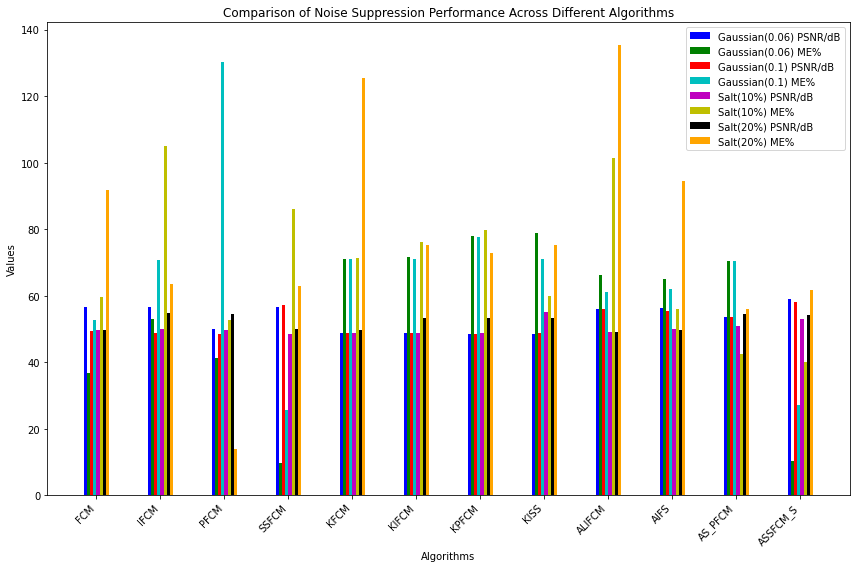

In [1]:
import numpy as np
import matplotlib.pyplot as plt

# Data from the table
algorithms = ['FCM', 'IFCM', 'PFCM', 'SSFCM', 'KFCM', 'KIFCM', 'KPFCM', 'KISS', 
              'ALIFCM', 'AIFS', 'AS_PFCM', 'ASSFCM_S']

# Noise types and their corresponding PSNR/ME values for each algorithm
noise_types = ['Gaussian(0.06) PSNR/dB', 'Gaussian(0.06) ME%', 'Gaussian(0.1) PSNR/dB', 'Gaussian(0.1) ME%', 
               'Salt(10%) PSNR/dB', 'Salt(10%) ME%', 'Salt(20%) PSNR/dB', 'Salt(20%) ME%']

# Values corresponding to the table
values = [
    [56.67, 56.78, 49.90, 56.60, 48.87, 48.91, 48.57, 48.57, 56.15, 56.29, 53.72, 59.03],  # Gaussian(0.06) PSNR/dB
    [36.76, 52.96, 41.32, 9.72, 71.00, 71.54, 78.06, 78.98, 66.16, 65.17, 70.44, 10.40],   # Gaussian(0.06) ME/%
    [49.57, 48.73, 48.44, 57.22, 48.80, 48.92, 48.53, 48.92, 55.94, 55.29, 53.72, 58.24],  # Gaussian(0.1) PSNR/dB
    [52.61, 70.91, 130.21, 25.69, 70.97, 70.98, 77.71, 70.98, 61.18, 62.18, 70.44, 27.21], # Gaussian(0.1) ME/%
    [49.65, 49.98, 49.74, 48.63, 48.97, 48.97, 48.81, 55.27, 49.15, 50.02, 50.90, 52.91],  # Salt(10%) PSNR/dB
    [59.69, 104.92, 52.58, 85.96, 71.41, 76.19, 79.83, 60.03, 101.44, 56.01, 42.54, 40.10], # Salt(10%) ME/%
    [49.82, 54.72, 54.60, 49.98, 49.66, 53.21, 53.46, 53.20, 49.21, 49.82, 54.61, 54.34],  # Salt(20%) PSNR/dB
    [91.67, 63.63, 14.01, 62.92, 125.43, 75.25, 73.00, 75.30, 135.42, 94.54, 55.89, 61.67]  # Salt(20%) ME/%
]

# Plotting
fig, ax = plt.subplots(figsize=(12, 8))

bar_width = 0.05  # Width of each bar
index = np.arange(len(algorithms))  # X-axis positions for each group

# Colors for each noise type
colors = ['b', 'g', 'r', 'c', 'm', 'y', 'k', 'orange']

# Plot each noise type as bars with offset
for i, noise_type in enumerate(noise_types):
    ax.bar(index + i * bar_width, values[i], bar_width, label=noise_type, color=colors[i])

# Add labels, title, and legend
ax.set_xlabel('Algorithms')
ax.set_ylabel('Values')
ax.set_title('Comparison of Noise Suppression Performance Across Different Algorithms')
ax.set_xticks(index + bar_width * 3.5)  # Position the ticks in the center of the grouped bars
ax.set_xticklabels(algorithms, rotation=45, ha="right")
ax.legend()

plt.tight_layout()
plt.show()


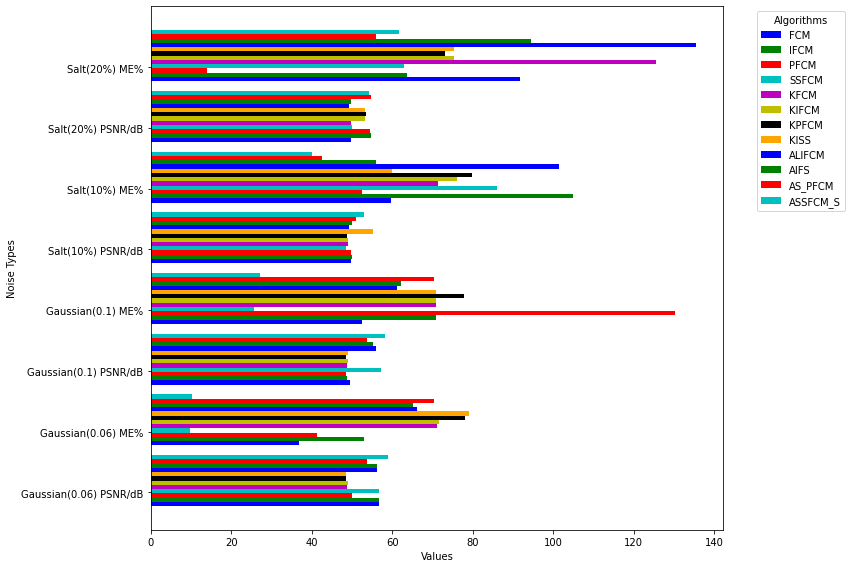

In [2]:
# Replotting the graph with noise types on the Y-axis and algorithms as bar labels
bar_width = 0.07
fig, ax = plt.subplots(figsize=(12, 8))

# Create horizontal bars for each algorithm for the noise types
for i, algorithm in enumerate(algorithms):
    ax.barh(np.arange(len(noise_types)) + i * bar_width, [values[j][i] for j in range(len(noise_types))], 
            bar_width, label=algorithm, color=colors[i % len(colors)])  # Rotate through the color palette

# Add labels, title, and legend
ax.set_ylabel('Noise Types')
ax.set_xlabel('Values')
# ax.set_title('Comparison of Noise Suppression Performance Across Different Algorithms')
ax.set_yticks(np.arange(len(noise_types)) + bar_width * 5.5 / 2)  # Center the labels
ax.set_yticklabels(noise_types, rotation=0)
ax.legend(title="Algorithms", bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.show()


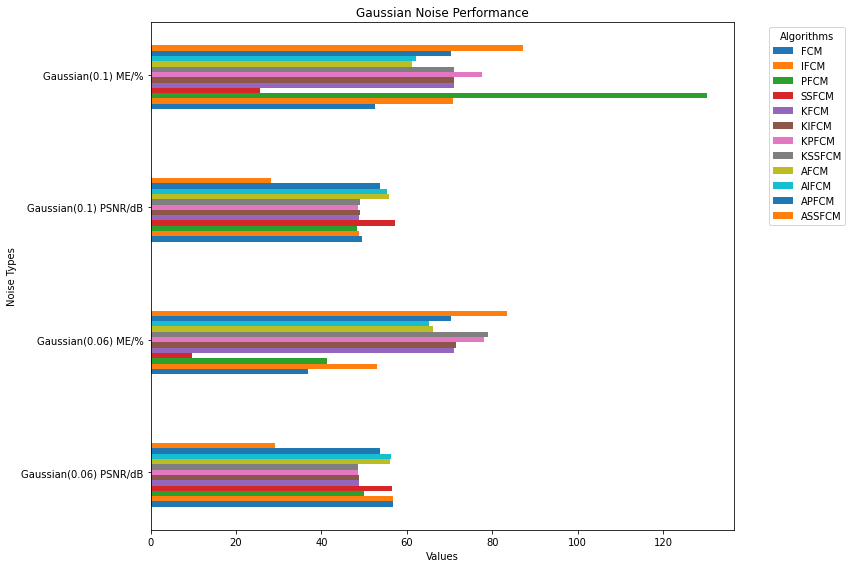

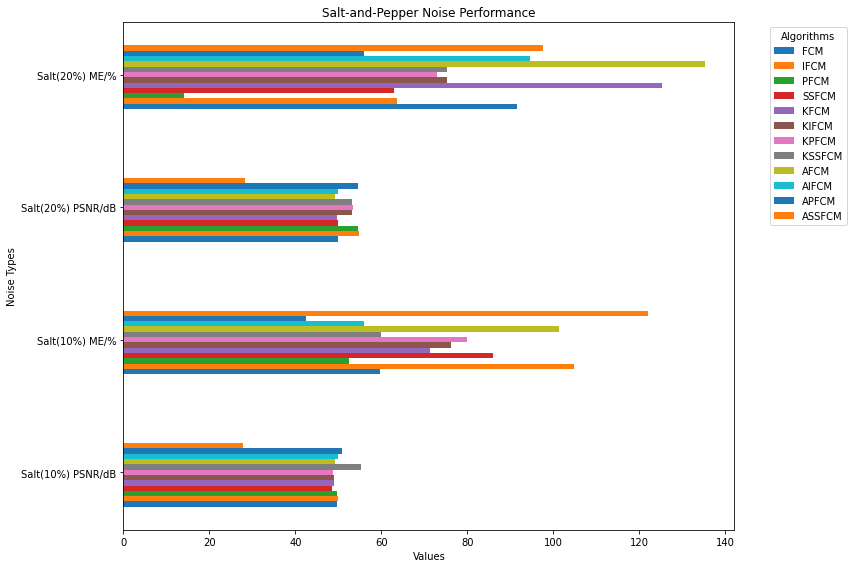

In [4]:
import numpy as np
import matplotlib.pyplot as plt

# Data from the table
algorithms = ['FCM', 'IFCM', 'PFCM', 'SSFCM', 'KFCM', 'KIFCM', 'KPFCM', 'KSSFCM', 
              'AFCM', 'AIFCM', 'APFCM', 'ASSFCM']

# Gaussian noise PSNR/ME values
gaussian_noise_types = ['Gaussian(0.06) PSNR/dB', 'Gaussian(0.06) ME/%', 'Gaussian(0.1) PSNR/dB', 'Gaussian(0.1) ME/%']
gaussian_values = [
    [56.67, 56.78, 49.90, 56.60, 48.87, 48.91, 48.57, 48.57, 56.15, 56.29, 53.72, 29.03],  # Gaussian(0.06) PSNR/dB
    [36.76, 52.96, 41.32, 9.72, 71.00, 71.54, 78.06, 78.98, 66.16, 65.17, 70.44, 83.40],   # Gaussian(0.06) ME/%
    [49.57, 48.73, 48.44, 57.22, 48.80, 48.92, 48.53, 48.92, 55.94, 55.29, 53.72, 28.24],  # Gaussian(0.1) PSNR/dB
    [52.61, 70.91, 130.21, 25.69, 70.97, 70.98, 77.71, 70.98, 61.18, 62.18, 70.44, 87.21], # Gaussian(0.1) ME/%
]

# Salt-and-pepper noise PSNR/ME values
salt_noise_types = ['Salt(10%) PSNR/dB', 'Salt(10%) ME/%', 'Salt(20%) PSNR/dB', 'Salt(20%) ME/%']
salt_values = [
    [49.65, 49.98, 49.74, 48.63, 48.97, 48.97, 48.81, 55.27, 49.15, 50.02, 50.90, 27.91],  # Salt(10%) PSNR/dB
    [59.69, 104.92, 52.58, 85.96, 71.41, 76.19, 79.83, 60.03, 101.44, 56.01, 42.54, 122.10], # Salt(10%) ME/%
    [49.82, 54.72, 54.60, 49.98, 49.66, 53.21, 53.46, 53.20, 49.21, 49.82, 54.61, 28.34],  # Salt(20%) PSNR/dB
    [91.67, 63.63, 14.01, 62.92, 125.43, 75.25, 73.00, 75.30, 135.42, 94.54, 55.89, 97.67]  # Salt(20%) ME/%
]

# Function to plot the bar chart
def plot_bar_chart(noise_types, values, title):
    fig, ax = plt.subplots(figsize=(12, 8))

    bar_width = 0.04
    index = np.arange(len(noise_types))

    for i, algorithm in enumerate(algorithms):
        ax.barh(index + i * bar_width, [values[j][i] for j in range(len(noise_types))], 
                bar_width, label=algorithm)

    ax.set_ylabel('Noise Types')
    ax.set_xlabel('Values')
    ax.set_title(title)
    ax.set_yticks(index + bar_width * len(algorithms) / 2)
    ax.set_yticklabels(noise_types)
    ax.legend(title="Algorithms", bbox_to_anchor=(1.05, 1), loc='upper left')

    plt.tight_layout()
    plt.show()

# Plot for Gaussian noise
plot_bar_chart(gaussian_noise_types, gaussian_values, 'Gaussian Noise Performance')

# Plot for Salt-and-Pepper noise
plot_bar_chart(salt_noise_types, salt_values, 'Salt-and-Pepper Noise Performance')


In [2]:
import os
import cv2
import glob
import PIL
import shutil
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from skimage import data
from skimage.util import montage 
import skimage.transform as skTrans
from skimage.transform import rotate
from skimage.transform import resize
from PIL import Image, ImageOps  


# neural imaging
import nilearn as nl
import nibabel as nib
import nilearn.plotting as nlplt
# !pip install git+https://github.com/miykael/gif_your_nifti # nifti to gif 
import gif_your_nifti.core as gif2nif


# ml libs
import keras
import keras.backend as K
from keras.callbacks import CSVLogger
import tensorflow as tf
from tensorflow.keras.utils import plot_model
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from tensorflow.keras.models import *
from tensorflow.keras.layers import *
from tensorflow.keras.optimizers import *
from tensorflow.keras.callbacks import ModelCheckpoint, ReduceLROnPlateau, EarlyStopping, TensorBoard


# Make numpy printouts easier to read.
np.set_printoptions(precision=3, suppress=True)
# DEFINE seg-areas  
SEGMENT_CLASSES = {
    0 : 'NOT tumor',
    1 : 'NECROTIC/CORE', # or NON-ENHANCING tumor CORE
    2 : 'EDEMA',
    3 : 'ENHANCING' # original 4 -> converted into 3 later
}

# there are 155 slices per volume
# to start at 5 and use 145 slices means we will skip the first 5 and last 5 
VOLUME_SLICES = 100 
VOLUME_START_AT = 22 # first slice of volume that we will include

Text(0.5, 1.0, 'Mask')

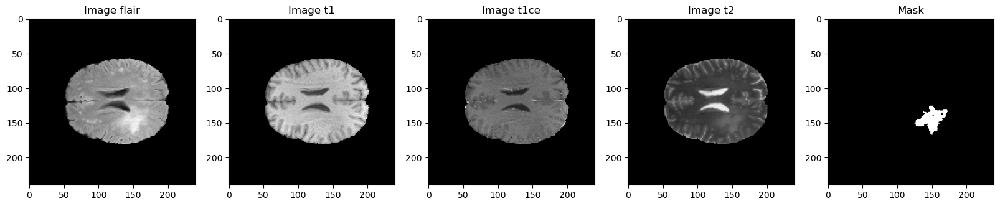

In [7]:
TRAIN_DATASET_PATH = 'D:/archive/1/MICCAI_BraTS2020_TrainingData/BraTS20_Training_003/'
VALIDATION_DATASET_PATH = 'D:/archive/2/MICCAI_BraTS2020_ValidationData/BraTS20_Validation_003/'

test_image_flair=nib.load(TRAIN_DATASET_PATH + 'BraTS20_Training_003_flair.nii').get_fdata() #flair
test_image_t1=nib.load(TRAIN_DATASET_PATH + 'BraTS20_Training_003_t1.nii').get_fdata() #t1
test_image_t1ce=nib.load(TRAIN_DATASET_PATH + 'BraTS20_Training_003_t1ce.nii').get_fdata() #t1ce
test_image_t2=nib.load(TRAIN_DATASET_PATH + 'BraTS20_Training_003_t2.nii').get_fdata() #t2
test_mask=nib.load(TRAIN_DATASET_PATH + 'BraTS20_Training_003_seg.nii').get_fdata() #seg


fig, (ax1, ax2, ax3, ax4, ax5) = plt.subplots(1,5, figsize = (20, 10))
slice_w = 25
ax1.imshow(test_image_flair[:,:,test_image_flair.shape[0]//2-slice_w], cmap = 'gray')
ax1.set_title('Image flair')
ax2.imshow(test_image_t1[:,:,test_image_t1.shape[0]//2-slice_w], cmap = 'gray')
ax2.set_title('Image t1')
ax3.imshow(test_image_t1ce[:,:,test_image_t1ce.shape[0]//2-slice_w], cmap = 'gray')
ax3.set_title('Image t1ce')
ax4.imshow(test_image_t2[:,:,test_image_t2.shape[0]//2-slice_w], cmap = 'gray')
ax4.set_title('Image t2')
ax5.imshow(test_mask[:,:,test_mask.shape[0]//2-slice_w], cmap = 'gray')
ax5.set_title('Mask')


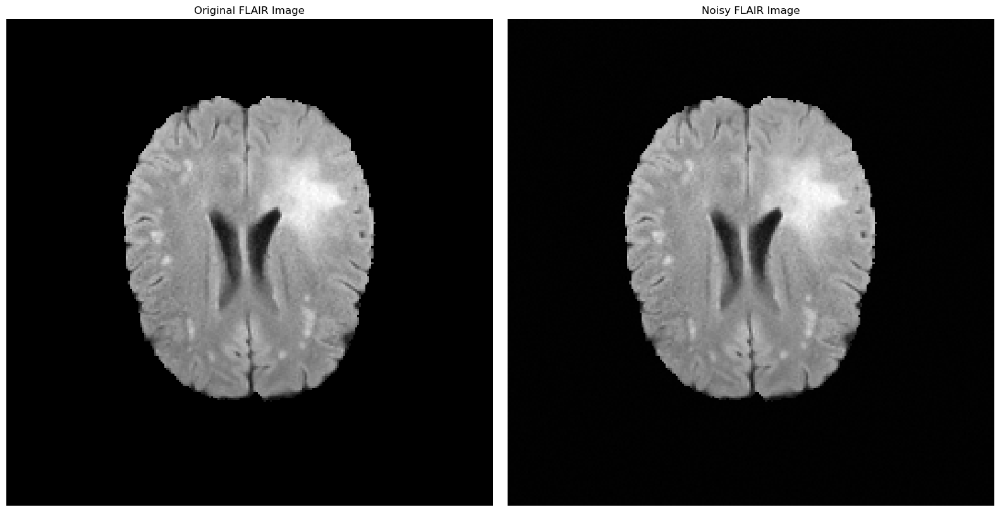

In [27]:
import numpy as np
import nibabel as nib
import matplotlib.pyplot as plt

# File path
TRAIN_DATASET_PATH = 'D:/archive/1/MICCAI_BraTS2020_TrainingData/BraTS20_Training_003/'

# Load the FLAIR image
test_image_flair = nib.load(TRAIN_DATASET_PATH + 'BraTS20_Training_003_flair.nii').get_fdata()

# Apply Gaussian noise
mean = 0
std_dev = 0.9  # Adjust for noise level
gaussian_noise = np.random.normal(mean, std_dev, test_image_flair.shape)
test_image_flair_noisy = test_image_flair + gaussian_noise

# Slice for visualization
slice_w = 26
mid_slice = test_image_flair.shape[0] // 2 - slice_w

# Rotate the axis for better visualization
flair_original_rotated = np.rot90(test_image_flair[:, :, mid_slice])
flair_noisy_rotated = np.rot90(test_image_flair_noisy[:, :, mid_slice])

# Plotting
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 8))

ax1.imshow(flair_original_rotated, cmap='gray')
ax1.set_title('Original FLAIR Image')
ax1.axis('off')

ax2.imshow(flair_noisy_rotated, cmap='gray')
ax2.set_title('Noisy FLAIR Image')
ax2.axis('off')

plt.tight_layout()
plt.show()


In [28]:
# # Normalize and convert to uint8
# flair_noisy_rotated_uint8 = (flair_noisy_rotated * 255).astype(np.uint8)

# # Convert to BGR format
# noisy_image_bgr = cv2.cvtColor(flair_noisy_rotated_uint8, cv2.COLOR_GRAY2BGR)

# # Save the image
# output_path = 'D:/Journal/4/code/brainimg.jpg'
# cv2.imwrite(output_path, noisy_image_bgr)


In [36]:

def calculate_spatial_information(image):
    kernel = np.ones((3, 3), np.float32) / 9
    sp_info = cv2.filter2D(image, -1, kernel)
    return sp_info

# Function to perform semi-supervised fuzzy clustering

# Fix for DeprecationWarning
def semi_supervised_fuzzy_clustering(data_points, spatial_info, n_clusters, max_iterations, m, rho, lambda_val):
    n_points = len(data_points)
    n_features = data_points.shape[1]

    # Initialize cluster centers randomly
    criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 100, 0.2)
    _, labels, centers = cv2.kmeans(data_points.reshape(-1, 1), n_clusters, None, criteria, 10, cv2.KMEANS_RANDOM_CENTERS)
    centers = centers.flatten()

    # Initialize membership matrix
    membership_matrix = np.random.rand(n_clusters, n_points)

    for iteration in range(max_iterations):
        # Calculate weights
        psi_1 = np.sum([np.sum(membership_matrix[j]**m * np.linalg.norm(data_points - centers[j], axis=1)**2) for j in range(n_clusters)])
        psi_2 = np.sum([np.sum(membership_matrix[j]**m * spatial_info) for j in range(n_clusters)])
        
        # Avoiding potential overflow by using logarithms
        log_psi_1 = -psi_1 / lambda_val
        log_psi_2 = -psi_2 / lambda_val

        # Stable calculation of weights
        w_1 = np.exp(log_psi_1 - np.logaddexp(log_psi_1, log_psi_2))
        w_2 = np.exp(log_psi_2 - np.logaddexp(log_psi_1, log_psi_2))

        # Update membership matrix
        for i in range(n_points):
            for j in range(n_clusters):
                numerator = (1 + rho * (1 - 1)) * np.sum([w_1 * np.linalg.norm(data_points[i] - centers[j])**2 + w_2 * spatial_info[i] for k in range(n_clusters)])
                denominator = sum([(w_1 * np.linalg.norm(data_points[i] - centers[k])**2 + w_2 * spatial_info[i]) for k in range(n_clusters)]) + rho
                membership_matrix[j, i] = 1 / (1 + rho) * numerator / denominator
        
        # Update cluster centers
        for j in range(n_clusters):
            # Ensure the centers are updated with proper shape
            numerator = np.sum([membership_matrix[j, i]**m * data_points[i] for i in range(n_points)], axis=0) + rho * np.sum([(membership_matrix[j, i] - 1)**m * data_points[i] for i in range(n_points)], axis=0)
            denominator = np.sum([membership_matrix[j, i]**m for i in range(n_points)]) + rho * np.sum([(membership_matrix[j, i] - 1)**m for i in range(n_points)])
            # The denominator should not be zero, to avoid division by zero
            if denominator != 0:
                centers[j] = numerator / denominator
            else:
                centers[j] = 0  # Handle potential zero denominator

    # Return cluster centers and membership matrix
    return centers, membership_matrix


C:\Users\Admin\AppData\Local\Temp\ipykernel_8992\3778383009.py:48: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  centers[j] = numerator / denominator


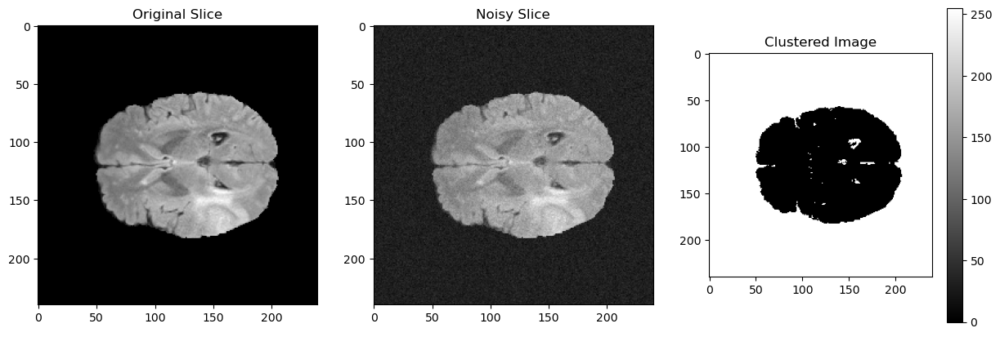

In [37]:
import nibabel as nib
import numpy as np
import cv2
import matplotlib.pyplot as plt

# Load the NIfTI image
nii_image = nib.load('D:/archive/1/MICCAI_BraTS2020_TrainingData/BraTS20_Training_003/BraTS20_Training_003_flair.nii')
image_data = nii_image.get_fdata()

# Select a 2D slice for processing (e.g., middle slice)
slice_index = image_data.shape[2] // 2  # Selecting the middle slice
slice_data = image_data[:, :, slice_index]

# Apply Gaussian noise
noise_sigma = 20
noisy_slice = slice_data + noise_sigma * np.random.normal(0, 1, slice_data.shape)

# Normalize the image slice for clustering
noisy_slice = cv2.normalize(noisy_slice, None, alpha=0, beta=1, norm_type=cv2.NORM_MINMAX)

# Compute spatial information
spatial_info = calculate_spatial_information(noisy_slice)

# Reshape data for clustering
data_points = noisy_slice.flatten().astype(np.float32)  # Ensure the data is float32
spatial_info_flattened = spatial_info.flatten().astype(np.float32)  # Ensure the spatial info is float32

# Define clustering parameters
n_clusters = 3
max_iterations = 1
m = 2
rho = 0.5
lambda_val = 1.0

# Apply semi-supervised fuzzy clustering
centers, membership_matrix = semi_supervised_fuzzy_clustering(
    data_points.reshape(-1, 1),
    spatial_info_flattened,
    n_clusters,
    max_iterations,
    m,
    rho,
    lambda_val
)

# Reshape membership matrix for visualization
clustered_image = np.argmax(membership_matrix, axis=0).reshape(noisy_slice.shape)

# Normalize clustered image for better visualization (mapping cluster labels to 0-255)
clustered_image_normalized = cv2.normalize(clustered_image.astype(np.float32), None, alpha=0, beta=255, norm_type=cv2.NORM_MINMAX)
clustered_image_normalized = clustered_image_normalized.astype(np.uint8)

# Visualize the results
plt.figure(figsize=(15, 5))
plt.subplot(1, 3, 1)
plt.title("Original Slice")
plt.imshow(slice_data, cmap='gray')
plt.subplot(1, 3, 2)
plt.title("Noisy Slice")
plt.imshow(noisy_slice, cmap='gray')
plt.subplot(1, 3, 3)
plt.title("Clustered Image")
plt.imshow(clustered_image_normalized, cmap='gray')  # Using jet colormap for better clarity
plt.colorbar()
plt.show()


C:\Users\Admin\AppData\Local\Temp\ipykernel_8992\3778383009.py:48: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  centers[j] = numerator / denominator


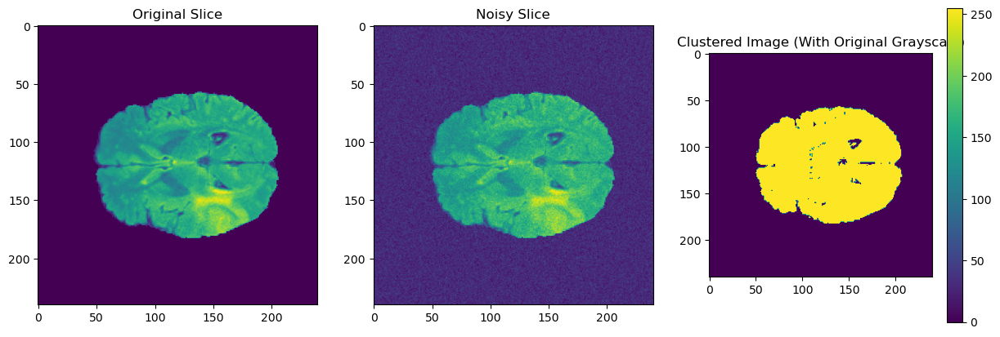

In [42]:
import nibabel as nib
import numpy as np
import cv2
import matplotlib.pyplot as plt

# Load the NIfTI image
nii_image = nib.load('D:/archive/1/MICCAI_BraTS2020_TrainingData/BraTS20_Training_003/BraTS20_Training_003_flair.nii')
image_data = nii_image.get_fdata()

# Select a 2D slice for processing (e.g., middle slice)
slice_index = image_data.shape[2] // 2  # Selecting the middle slice
slice_data = image_data[:, :, slice_index]

# Apply Gaussian noise
noise_sigma = 20
noisy_slice = slice_data + noise_sigma * np.random.normal(0, 1, slice_data.shape)

# Normalize the image slice for clustering
noisy_slice = cv2.normalize(noisy_slice, None, alpha=0, beta=1, norm_type=cv2.NORM_MINMAX)

# Compute spatial information
spatial_info = calculate_spatial_information(noisy_slice)

# Reshape data for clustering
data_points = noisy_slice.flatten().astype(np.float32)  # Ensure the data is float32
spatial_info_flattened = spatial_info.flatten().astype(np.float32)  # Ensure the spatial info is float32

# Define clustering parameters
n_clusters = 3
max_iterations = 1
m = 2
rho = 0.5
lambda_val = 1.0

# Apply semi-supervised fuzzy clustering
centers, membership_matrix = semi_supervised_fuzzy_clustering(
    data_points.reshape(-1, 1),
    spatial_info_flattened,
    n_clusters,
    max_iterations,
    m,
    rho,
    lambda_val
)

# Reshape membership matrix for visualization
clustered_image = np.argmax(membership_matrix, axis=0).reshape(noisy_slice.shape)

# Map clustered labels to original intensities
clustered_image_rescaled = np.zeros_like(slice_data, dtype=np.float32)
for cluster_idx in range(n_clusters):
    # Assign the mean intensity of the original slice to pixels in each cluster
    mask = clustered_image == cluster_idx  # Boolean mask for current cluster
    if np.any(mask):
        clustered_image_rescaled[mask] = np.mean(slice_data[mask])  # Map original intensities

# Normalize clustered image for better visualization
clustered_image_rescaled = cv2.normalize(clustered_image_rescaled, None, alpha=0, beta=255, norm_type=cv2.NORM_MINMAX)
clustered_image_rescaled = clustered_image_rescaled.astype(np.uint8)

# Visualize the results
plt.figure(figsize=(15, 5))
plt.subplot(1, 3, 1)
plt.title("Original Slice")
plt.imshow(slice_data)

plt.subplot(1, 3, 2)
plt.title("Noisy Slice")
plt.imshow(noisy_slice)

plt.subplot(1, 3, 3)
plt.title("Clustered Image (With Original Grayscale)")
plt.imshow(clustered_image_rescaled)
plt.colorbar()
plt.show()


Original slice shape: (240, 240)
Noisy slice shape: (240, 240)
Clustered image shape: (240, 240)


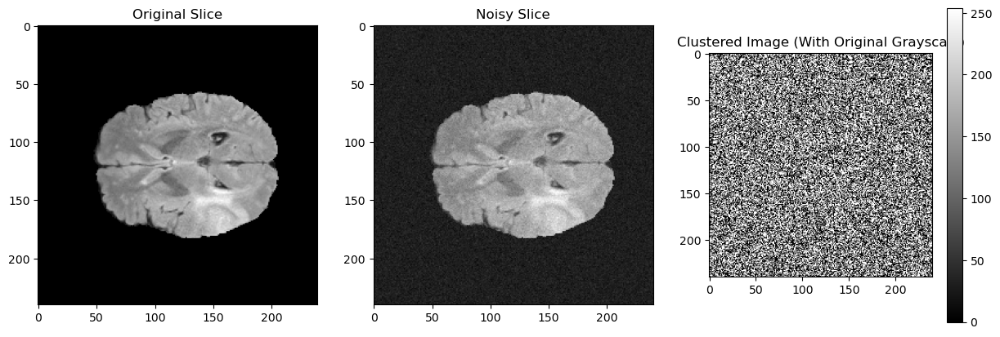

In [43]:
membership_matrix = np.random.rand(len(data_points), n_clusters)  # Replace with actual membership matrix
membership_matrix /= membership_matrix.sum(axis=1, keepdims=True)  # Normalize

# Reshape membership matrix for visualization
clustered_image = np.argmax(membership_matrix, axis=1).reshape(noisy_slice.shape)

# Map clustered labels to original intensities
clustered_image_rescaled = np.zeros_like(slice_data, dtype=np.float32)
for cluster_idx in range(n_clusters):
    # Assign the mean intensity of the original slice to pixels in each cluster
    mask = clustered_image == cluster_idx  # Boolean mask for current cluster
    if np.any(mask):
        clustered_image_rescaled[mask] = np.mean(slice_data[mask])  # Map original intensities

# Normalize clustered image for better visualization
clustered_image_rescaled = cv2.normalize(clustered_image_rescaled, None, alpha=0, beta=255, norm_type=cv2.NORM_MINMAX)
clustered_image_rescaled = clustered_image_rescaled.astype(np.uint8)

# Debugging shapes
print(f"Original slice shape: {slice_data.shape}")
print(f"Noisy slice shape: {noisy_slice.shape}")
print(f"Clustered image shape: {clustered_image_rescaled.shape}")

# Visualize the results
plt.figure(figsize=(15, 5))
plt.subplot(1, 3, 1)
plt.title("Original Slice")
plt.imshow(slice_data, cmap='gray')

plt.subplot(1, 3, 2)
plt.title("Noisy Slice")
plt.imshow(noisy_slice, cmap='gray')

plt.subplot(1, 3, 3)
plt.title("Clustered Image (With Original Grayscale)")
plt.imshow(clustered_image_rescaled, cmap='gray')
plt.colorbar()
plt.show()